## Import commands, etc.

In [1]:
# %load SSTsharp_v2.py
"""
v2: same as original, but just meant to explore the various observational SST datasets

Perform the SST# calulation of Fueglistaler, S. (2019)
 
Observational evidence for two modes of coupling between sea surface temperatures, 
tropospheric temperature profile, and shortwave cloud radiative effect in the tropics. 
Geophysical Research Letters, 46, 9890–9898. https://doi.org/10.1029/2019GL083990
"""
import sys
sys.path.append('/home/zelinka1/git/xcdat/')

import xsearch as xs
import xcdat as xc
import xarray as xr
import pandas as pd
import json
import glob
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from global_land_mask import globe
import cartopy.crs as ccrs
import cartopy
import xskillscore as xss

plt.rcParams['lines.linewidth'] = 2
plt.rcParams['font.size']=12
plt.rcParams['pcolor.shading']='auto'

# Define percentile bins
#prctl_bins = np.arange(1,101,1)
prctl_bins = np.arange(0,105,5)
prctl_binmids = (prctl_bins[:-1]+prctl_bins[1:])/2
lb = len(prctl_bins)#len(prctl_binmids) # number of bins

In [2]:
"""
Library to compute weighted quantiles, including the weighted median, of
numpy arrays.

https://github.com/nudomarinero/wquantiles
"""
def quantile_1D(data, weights, quantile):
    """
    Compute the weighted quantile of a 1D numpy array.

    Parameters
    ----------
    data : ndarray
        Input array (one dimension).
    weights : ndarray
        Array with the weights of the same size of `data`.
    quantile : float
        Quantile to compute. It must have a value between 0 and 1.

    Returns
    -------
    quantile_1D : float
        The output value.
    """
    # Check the data
    if not isinstance(data, np.matrix):
        data = np.asarray(data)
    if not isinstance(weights, np.matrix):
        weights = np.asarray(weights)
    nd = data.ndim
    if nd != 1:
        raise TypeError("data must be a one dimensional array")
    ndw = weights.ndim
    if ndw != 1:
        raise TypeError("weights must be a one dimensional array")
    if data.shape != weights.shape:
        raise TypeError("the length of data and weights must be the same")
    if ((quantile > 1.) or (quantile < 0.)):
        raise ValueError("quantile must have a value between 0. and 1.")
    # Sort the data
    ind_sorted = np.argsort(data)
    sorted_data = data[ind_sorted]
    sorted_weights = weights[ind_sorted]
    # Compute the auxiliary arrays
    Sn = np.cumsum(sorted_weights)
    # TODO: Check that the weights do not sum zero
    #assert Sn != 0, "The sum of the weights must not be zero"
    Pn = (Sn-0.5*sorted_weights)/Sn[-1]
    # Get the value of the weighted median
    return np.interp(quantile, Pn, sorted_data)


def quantile(data, weights, quantile):
    """
    Weighted quantile of an array with respect to the last axis.

    Parameters
    ----------
    data : ndarray
        Input array.
    weights : ndarray
        Array with the weights. It must have the same size of the last 
        axis of `data`.
    quantile : float
        Quantile to compute. It must have a value between 0 and 1.

    Returns
    -------
    quantile : float
        The output value.
    """
    # TODO: Allow to specify the axis
    nd = data.ndim
    if nd == 0:
        TypeError("data must have at least one dimension")
    elif nd == 1:
        return quantile_1D(data, weights, quantile)
    elif nd > 1:
        n = data.shape
        imr = data.reshape((np.prod(n[:-1]), n[-1]))
        result = np.apply_along_axis(quantile_1D, -1, imr, weights, quantile)
        return result.reshape(n[:-1])


def median(data, weights):
    """
    Weighted median of an array with respect to the last axis.

    Alias for `quantile(data, weights, 0.5)`.
    """
    return quantile(data, weights, 0.5)

def get_percentiles(data,wts,bins):
    # wrapper for previous functions
    quantiles = bins/100
    newbins=[]
    for q in quantiles:
        newbins.append(quantile_1D(data, wts, q))
    return newbins


In [3]:
# TSDATA,yrs,weights = OBSdata.to_numpy(),years,WTS30.to_numpy()
# # Describe the SST distribution in terms of the average SST in equal area bins upon sorting by SST.  
# lt,la,lo = TSDATA.shape
# # TS2 = np.reshape(TSDATA,(lt,la*lo))
# binavg = np.zeros((lt,lb))
# binwts = np.zeros((lt,lb))
# for i in range(lt):
#     # sorter0 = TS2[i,:]
#     # sorter = sorter0[np.where(sorter0!=999)]
#     data00 = TSDATA[i,:].flatten()
#     wts0 = weights[i,:].flatten()
#     data = data00[np.where(~np.isnan(data00))]
#     wts = wts0[np.where(~np.isnan(data00))]
#     # bins = np.nanpercentile(sorter,prctl_bins)[-1::-1] # order these to be from warmest to coldest
#     bins = get_percentiles(data,wts,prctl_bins)[-1::-1] # order from warmest to coldest
#     inds = np.digitize(data, bins) # find locations with TSDATA within bins
#     cnt=-1
#     for b in np.arange(len(bins)): # not true anymore? note that bin 0 only has a single (max) value
#         cnt+=1
#         numer = np.nansum(data[np.where(inds==b)]*wts[np.where(inds==b)])
#         denom = np.nansum(wts[np.where(inds==b)])
#         binavg[i,cnt] = numer/denom
#         binwts[i,cnt] = denom

In [4]:
# b=0
# bins = get_percentiles(data,wts,prctl_bins)[-1::-1]
# data[np.where(inds==b)],bins
# upto = np.where(prctl_bins==30)[0][0]+1
# beyond = np.where(prctl_bins==75)[0][0]
# # bins
# bins[beyond:],prctl_bins[beyond:],bins[:upto],prctl_bins[:upto]
# # sharp = np.nansum(binwts[:,:upto],1)
# # flat = np.nansum(binwts[:,beyond:],1)
# # plt.plot(sharp,flat,'o',alpha=0.1)
# # plt.plot(np.linspace(0.11117,0.1112,15),np.linspace(0.11117,0.1112,15),'--')
# # len(prctl_bins),bins
# np.max(inds),beyond,bins[beyond:],data[np.where(inds==20)]

In [5]:
def do_SSTsharp_sorting(TSDATA,yrs,weights):
    # Describe the SST distribution in terms of the average SST in equal area bins upon sorting by SST.  
    lt,la,lo = TSDATA.shape
    # TS2 = np.reshape(TSDATA,(lt,la*lo))
    binavg = np.zeros((lt,lb))
    binwts = np.zeros((lt,lb))
    for i in range(lt):
        # sorter0 = TS2[i,:]
        # sorter = sorter0[np.where(sorter0!=999)]
        data00 = TSDATA[i,:].flatten()
        wts0 = weights[i,:].flatten()
        data = data00[np.where(~np.isnan(data00))]
        wts = wts0[np.where(~np.isnan(data00))]
        # bins = np.nanpercentile(sorter,prctl_bins)[-1::-1] # order these to be from warmest to coldest
        bins = get_percentiles(data,wts,prctl_bins)[-1::-1] # order these to be from warmest to coldest
        inds = np.digitize(data, bins) # find locations with TSDATA within bins
        cnt=-1
        for b in np.arange(len(bins)): # note that bin 0 only has a single (max) value
            cnt+=1
            numer = np.nansum(data[np.where(inds==b)]*wts[np.where(inds==b)])
            denom = np.nansum(wts[np.where(inds==b)])
            binavg[i,cnt] = numer/denom
            binwts[i,cnt] = denom

    # Deseasonalize the data -- remove climatology computed over 1982-2014 inclusive:
    these=np.where(np.logical_and(yrs>=1982, yrs<=2014))[0]
    binanom = np.zeros((lt,lb))
    for m in range(12):
        binanom[m::12,:] = binavg[m::12,:] - np.nanmean(binavg[these[m::12],:],0)

    # SST# = the temperature of the warmest 30% minus the tropical average SST
    # SSTflat = the temperature of the coldest 30% minus the tropical average SST
    TRavg = np.nansum(binanom*binwts,1) / np.nansum(binwts,1)
    binanom2 = (binanom.T - TRavg).T
    upto = np.where(prctl_bins==30)[0][0]+1    # +1 because index0 contains max(SST) only
    beyond = np.where(prctl_bins==75)[0][0]    # because 75 means 70<data<=75th percentile
    sharp = np.nansum(binanom2[:,:upto]*binwts[:,:upto],1) / np.nansum(binwts[:,:upto],1)
    flat = np.nansum(binanom2[:,beyond:]*binwts[:,beyond:],1) / np.nansum(binwts[:,beyond:],1)
   
    DS = xr.Dataset({
        'binned_anom':(('time','bins'),binanom.data),
        'binwts':(('time','bins'),binwts.data),
        'mean':(('time'),TRavg.data),
        'sharp':(('time'),sharp.data),
        'flat':(('time'),flat.data)
    },
        coords={
            'time': data0.time, 
            'bins': prctl_bins.data#prctl_binmids.data
        }
    ) 
    DS.time.attrs['axis'] = 'T'
    DS2 = DS.bounds.add_missing_bounds()
        
#     return (binavg,sharp,regmap,regbin,std_regbin,trendbin,std_trendbin,binned_anom,binanom2)
    return (binavg,DS2,binanom2)


In [6]:
# def make_figs(YRS,ANN,MEAN,dataname):
def make_figs(YRS,ANN,dataname):

    raw={}
    smooth={}
    
    for flavor in ['mean','sharp','flat']:
        # if flavor=='mean':
        #     raw[flavor] = MEAN
        # else:
        #     raw[flavor] = ANN[flavor]
        raw[flavor] = ANN[flavor]
        d = pd.Series(raw[flavor])
        runmean = d.rolling(5, center=True).mean()
        smooth[flavor] = runmean          
    
#     plt.figure(figsize=(9,9))
#     plt.subplot(3,1,1)
#     cnt=0
#     cnt+=1
#     plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
#     plt.plot(YRS,MEAN,alpha=0.4,color='C0',label='raw')
#     d = pd.Series(MEAN)
#     runmean = d.rolling(5, center=True).mean()
#     plt.plot(YRS,runmean,color='C1',label='5-yr smoother')
#     plt.xlabel('Time')
#     plt.xlim(1880,2023)
#     plt.ylim(-1,1)
#     plt.title(dataname,loc='left')
#     plt.ylabel('SSTbar')
#     plt.legend()
#     plt.grid()
#     smooth['mean'] = runmean
    
#     cnt=1
#     for flavor in ['sharp','flat']:
#         cnt+=1
#         plt.subplot(3,1,cnt)
#         plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
#         plt.plot(YRS,raw[flavor],alpha=0.4,color='C0')#,label='raw')        
#         plt.plot(YRS,smooth[flavor],color='C1',label='5-yr smoother')
#         if cnt==3:
#             plt.xlabel('Time')
#         plt.xlim(1880,2023)
#         plt.ylim(-0.20,0.20)
#         plt.ylabel('SST '+flavor)
#         plt.grid()
     
#     #plt.savefig('/home/zelinka1/figures/omip/'+dataname+'.SSTbar_'+flavor+'.png',bbox_inches='tight')

    return(raw,smooth)

In [7]:
# CREATE A COMMON GRID:
# USE THE PCMDI-AMIP BOUNDARY CONDITION GRID:
kern = xc.open_dataset('/p/user_pub/work/input4MIPs/CMIP6/CMIP/PCMDI/PCMDI-AMIP-1-1-8/ocean/mon/tos/gn/v20220622/tos_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-8_gn_187001-202112.nc', lon_orient=(0, 360))
lat = np.array(kern.lat)
lon = np.array(kern.lon)
output_grid = xc.regridder.grid.create_grid(lat=lat, lon=lon)

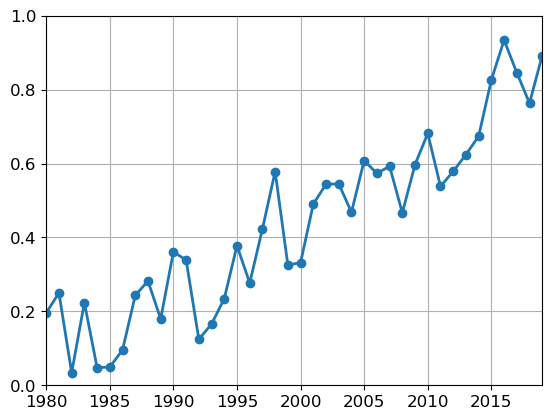

In [8]:
ds = xc.open_dataset('/p/user_pub/climate_work/zelinka1/HadCRUT/HadCRUT.5.0.1.0.analysis.anomalies.ensemble_mean.nc')
GMST = ds.spatial.average('tas_mean', axis=["X", "Y"])['tas_mean']
annGMST = GMST.groupby('time.year').mean('time')
plt.plot(annGMST.year,annGMST,'-o')
plt.xlim(1980,2019)
plt.ylim(0,1)
plt.grid()

## Load in all the data, compute trends, tropical indices, etc.

In [9]:
datanames = ['PCMDI-AMIP-1-1-9','NOAA-OISST-v2.0','NOAA-OISST-v2.1',
             'NOAA_ERSST_V5','COBE','COBE2',
             'Vaccaro2021','CW_had4_krig_v2','CW_had4sst4_krig_v2',
             'HadISST-1.1','HadISST-2.2','HadISST-2.3','HadSST4']
COLORS,LINES = {},{}
COLORS['PCMDI-AMIP-1-1-9'],LINES['PCMDI-AMIP-1-1-9'] =       'k','-'
COLORS['NOAA-OISST-v2.0'],LINES['NOAA-OISST-v2.0'] =         'C3','-'
COLORS['NOAA-OISST-v2.1'],LINES['NOAA-OISST-v2.1'] =         'C3','--'
COLORS['NOAA_ERSST_V5'],LINES['NOAA_ERSST_V5'] =             'C4','-'
COLORS['COBE'],LINES['COBE'] =                               'C0','-'
COLORS['COBE2'],LINES['COBE2'] =                             'C0','--'
COLORS['Vaccaro2021'],LINES['Vaccaro2021'] =                 'C6','-'
COLORS['CW_had4_krig_v2'],LINES['CW_had4_krig_v2'] =         'C7','-'
COLORS['CW_had4sst4_krig_v2'],LINES['CW_had4sst4_krig_v2'] = 'C7','--'
COLORS['HadISST-1.1'],LINES['HadISST-1.1'] =                 'C1','-'
COLORS['HadISST-2.2'],LINES['HadISST-2.2'] =                 'C1', '--'
COLORS['HadISST-2.3'],LINES['HadISST-2.3'] =                 'C1', ':'
COLORS['HadSST4'],LINES['HadSST4'] =                         'C1', '-.'
COLORS['Dataset_Mean'],LINES['Dataset_Mean'] =               'k','-'

/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


PermissionError: [Errno 13] Permission denied: '/home/zelinka1/figures/omip/PCMDI-AMIP-1-1-9.binned_SSTs.png'

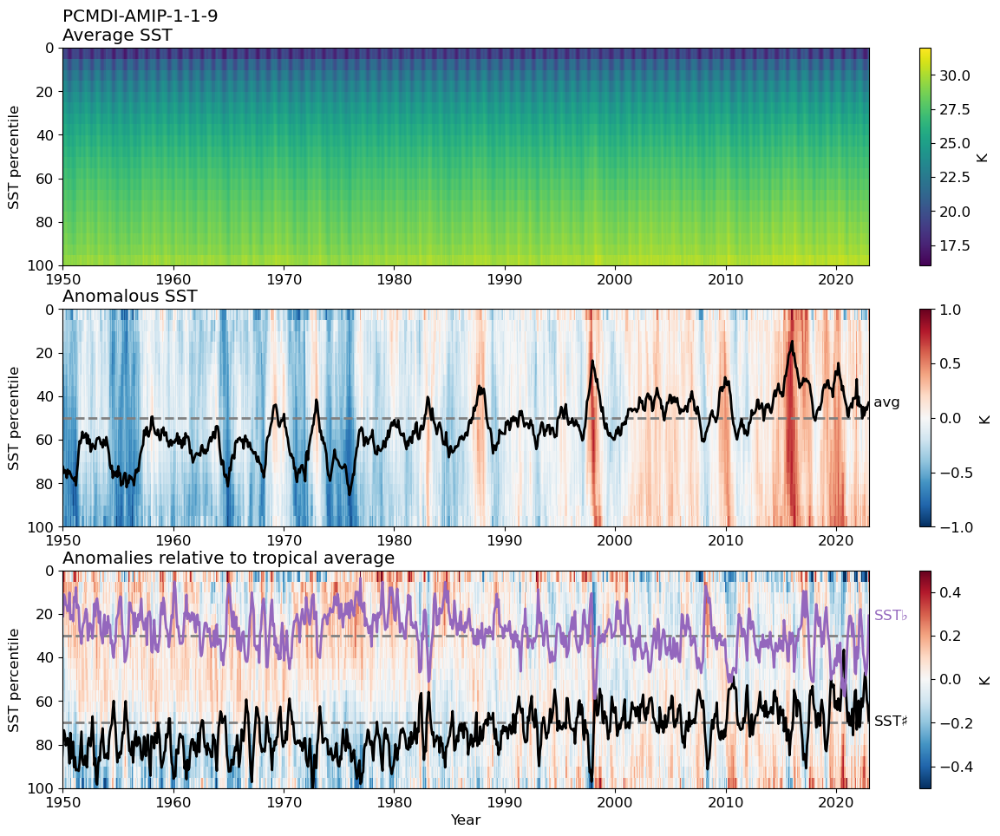

In [10]:
# NEW
MAPS={}
RAW={}
SMOOTH={}
YRS={}
BIN={}
cnt=-1
for dataname in datanames:    
    cnt+=1        

    # USE A COMMON TIME PERIOD:
    start = '1880-01'#-01'    
    end = '2022-12'#-31'      
    # # TEMPORARY:
    # start = '1960-01'
    # end = '2015-12'

    offset=0
    if dataname == 'NOAA-OISST-v2.1': # updated 4/27/23
        var='sst'
        start = '1982-01-01'
        filename = '/p/user_pub/climate_work/zelinka1/NOAA-OISST-v2.1/sst.mon.mean.nc'
    if dataname == 'NOAA-OISST-v2.0':
        var='sst'
        start = '1982-01-01'
        filename = '/p/user_pub/climate_work/zelinka1/NOAA-OISST-v2/sst.mnmean.nc'
    if dataname == 'COBE': # updated 4/27/23
        var='sst'
        filename = '/p/user_pub/climate_work/zelinka1/COBE/sst.mon.mean.nc'   
    if dataname == 'COBE2': # updated 4/27/23
        var='sst'
        filename = '/p/user_pub/climate_work/zelinka1/COBE2/sst.mon.mean.nc'      
    if dataname == 'NOAA_ERSST_V5': # updated 4/27/23
        var='sst'
#         filename = '/p/user_pub/climate_work/zelinka1/ERSST/*.nc'
        filename = '/p/user_pub/climate_work/zelinka1/ERSST/sst.mnmean.nc'
    if dataname == 'HadISST-1.1': # updated 4/27/23
        var='sst'
        filename = '/p/user_pub/climate_work/zelinka1/HadISST/HadISST_sst.nc'
    if dataname == 'HadISST-2.2':
        var='tos'
        filename = '/p/user_pub/climate_work/zelinka1/HadISST/HadISST-2-2-0-0-0.nc'
    if dataname == 'HadISST-2.3':
        var='tos'
        filename = '/p/user_pub/climate_work/zelinka1/HadISST/HadISST.2.3.0.c_ensemble_member_001.nc'
        offset = -273.15 # this dataset is reported in K
    if dataname == 'HadSST4':
        var='tos'
        filename = '/p/user_pub/climate_work/zelinka1/HadSST/HadSST.4.0.1.0_median.nc'
    if dataname == 'ERA5': # updated 4/27/23
        var='skt'
        filename = '/p/user_pub/climate_work/zelinka1/ERA5/ts_mon_ERA5_197901-202212.nc'
#         filename = '/p/user_pub/climate_work/zelinka1/ERA5/ts_mon_ERA5_197901-202012.nc'
    if dataname == 'PCMDI-AMIP-1-1-9': # input4MIPs
        # Merged SST based on UK MetOffice HadISST and NCEP OI2 
        # (Based on Hurrell SST/sea ice consistency criteria applied to merged HadISST (1870-01 to 1981-10) & NCEP-0I2 (1981-11 to 2021-06)),
        var='tos'
#         filename = '/p/user_pub/climate_work/zelinka1/input4MIPs/tos_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-7_gn_187001-202106.nc'
        # filename = '/p/user_pub/work/input4MIPs/CMIP6/CMIP/PCMDI/PCMDI-AMIP-1-1-8/ocean/mon/tos/gn/v20220622/tos_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-8_gn_187001-202112.nc'
        filename = '/p/user_pub/work/input4MIPs/CMIP6Plus/CMIP/PCMDI/PCMDI-AMIP-1-1-9/ocean/mon/tos/gn/v20230512/tos_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-9_gn_187001-202212.nc'
    if dataname == 'PCMDI-BCS': # input4MIPs
        # Merged SST based on UK MetOffice HadISST and NCEP OI2 
        # (Based on Hurrell SST/sea ice consistency criteria applied to merged HadISST (1870-01 to 1981-10) & NCEP-0I2 (1981-11 to 2021-06)),
        var='tosbcs'
#         filename = '/p/user_pub/climate_work/zelinka1/input4MIPs/tos_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-7_gn_187001-202106.nc'
        filename = '/p/user_pub/work/input4MIPs/CMIP6/CMIP/PCMDI/PCMDI-AMIP-1-1-8/ocean/mon/tosbcs/gn/v20220622/tosbcs_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-8_gn_187001-202112.nc'

    if dataname == 'CW_had4_krig_v2':
        var = 'temperature_anomaly'
        filename = '/p/user_pub/climate_work/zelinka1/pattern-effectMIP/Cowtan_Way2014/had4_krig_v2/had4_krig_v2_T63_bil_absolute_TS_values01.nc'
    if dataname == 'CW_had4sst4_krig_v2':
        var = 'temperature_anomaly'
        filename = '/p/user_pub/climate_work/zelinka1/pattern-effectMIP/Cowtan_Way2014/had4sst4_krig_v2/had4sst4_krig_v2_T63_bil_absolute_TS_values01.nc'
    if dataname == 'Vaccaro2021':
        var = 'temperature_anomaly'
        filename = '/p/user_pub/climate_work/zelinka1/pattern-effectMIP/Vaccaro_et_al_2021/vaccaro_et_al_2021_T63_bil_absolute_TS_values01.nc'
    
    ds = xc.open_mfdataset(filename, use_cftime = True)#, lon_orient=(0, 360))
    ds = ds.regridder.horizontal(var, output_grid, tool='xesmf', method='conservative')#'bilinear')

    if dataname == 'Vaccaro2021':    
        ds['time'] = pd.date_range(start="1850-01-15", end="2017-12-31", freq='M')
    
    data0 = ds.sel(time=slice(start,end))
    
    yrs = data0.time.dt.year
    mos = data0.time.dt.month
    years = yrs+(mos-0.5)/12 
    lat = np.array(data0.lat)
    lon = np.array(data0.lon)    
    
    OBSdata = data0[var].squeeze().compute() + offset

    # Set big negative values to NaN
    OBSdata = xr.where(OBSdata<-100,np.nan,OBSdata) 
        
    # Set the land to NaN:    
    lon_here = np.where(lon>180,lon-360,lon)
    lon_grid,lat_grid = np.meshgrid(lon_here,lat)
    globe_land_mask = globe.is_land(lat_grid,lon_grid)
    if len(OBSdata.shape) - len(globe_land_mask.shape) == 1: # have time dimension
        globe_land_mask_nd = np.tile(globe_land_mask,(OBSdata.shape[0],1,1))
    avgmap = xr.where(globe_land_mask_nd==True,np.nan,OBSdata) 

    # Get Area Weights:
    # area_wts = get_area_wts(OBSdata) # summing this over lat and lon = 1
    wt = data0.spatial.get_weights(axis=["Y", "X"])
    AW = (wt/wt.sum()) # summing this over lat and lon = 1
    _,area_wts = xr.broadcast(OBSdata.time,AW)
    # area_wts = np.tile(AW,(OBSdata.shape[0],1,1)) 
    WTS = xr.where(globe_land_mask_nd==True,0,area_wts)    
    
    # plt.subplots()
    # # area_wts.plot()
    # WTS.isel(time=-1).plot()
    # plt.title(dataname)     
    
    
    
    # Compute trends and "feedbacks" 
    # trend_slice = slice('1982-01','2010-12') # Andrews et al 2022 (almost)
    trend_slice = slice('1982','2015') # HadISST-2 ends in 2015
    # trend_slice = slice('1982-01','2017-12') # Vaccaro2021 ends in 2017
    # trend_slice = slice('1982-01','2021-12') 

    annmap = avgmap.groupby('time.year').mean('time')
    y = annmap.sel(year=trend_slice)
    x = y.year
    trendmap = 10*xss.linslope(x, y, dim='year', weights=None, keep_attrs=True)#, skipna=True # per decade
    
    # Regress maps on GMST anomalies
    x = GMST.sel(time=trend_slice).groupby('time.year').mean('time')
    y['year'] = x['year']
    fbk = xss.linslope(x, y, dim='year', weights=None, skipna=True, keep_attrs=True)

    DS = xr.Dataset({
        'annmap':(('year','lat','lon'),annmap.data),
        'trend':(('lat','lon'),trendmap.data),
        'fbk':(('lat','lon'),fbk.data),
    },
        coords={
            'year': annmap.year, 
            'lat': data0.lat, 
            'lon': data0.lon
        }
    ) 
    DS.year.attrs['axis'] = 'T'
    DS.lon.attrs['axis'] = 'X'
    DS.lat.attrs['axis'] = 'Y'
    DS2 = DS.bounds.add_missing_bounds()
    MAPS[dataname] = DS2


    if dataname == 'HadSST4':
        continue # this dataset is an anomaly so we can't do binning by absolute value of SST
        
    # FOCUS ON TROPICS FOR SST SHARP CALCULATIONS
    OBSdata = avgmap.sel(lat=slice(-30,30))
    WTS30 = WTS.sel(lat=slice(-30,30))

    binned_data,DATA,binned_anom2 = do_SSTsharp_sorting(OBSdata.to_numpy(),years,WTS30.to_numpy())
    BIN[dataname+'.data'] = binned_data
    BIN[dataname+'.binwts'] = DATA['binwts']
    BIN[dataname+'.yrs'] = years

    # sanity check figs:
    # ignore bin 0 (max value only)
    plt.figure(figsize=(15,15))
    plt.subplot(411)
    plt.pcolor(years,prctl_binmids,binned_data[:,1:].T,vmin=16,vmax=32) 
    plt.yticks(np.arange(0,120,20),np.arange(100,-20,-20))
    plt.xticks(np.arange(1950,2030,10),np.arange(1950,2030,10))
    plt.ylabel('SST percentile')
    plt.ylim(0,100)
    plt.xlim(1950,2023)
    plt.title(dataname+'\nAverage SST',loc='left') 
    cb=plt.colorbar()
    cb.set_label('K')

    plt.subplot(412)
    plt.pcolor(years,prctl_binmids,DATA['binned_anom'][:,1:].T,vmin=-1,vmax=1,cmap='RdBu_r')
    plt.yticks(np.arange(0,120,20),np.arange(100,-20,-20))
    plt.xticks(np.arange(1950,2030,10),np.arange(1950,2030,10))
    plt.ylabel('SST percentile')
    plt.ylim(0,100)
    plt.xlim(1950,2023)
    plt.title('Anomalous SST',loc='left') 
    plt.axhline(y=50,ls='--',color='gray')
    plt.plot(years,50+50*DATA['mean'],'k',lw=2)
    plt.text(2023,50+50*DATA['mean'][-1],r' avg',ha='left',va='center',color='k')  
    cb=plt.colorbar()
    cb.set_label('K')

    plt.subplot(413)
    plt.pcolor(years,prctl_binmids,binned_anom2[:,1:].T,vmin=-0.5,vmax=0.5,cmap='RdBu_r')
    plt.yticks(np.arange(0,120,20),np.arange(100,-20,-20))
    plt.xticks(np.arange(1950,2030,10),np.arange(1950,2030,10))
    plt.ylabel('SST percentile')
    plt.ylim(0,100)
    plt.xlim(1950,2023)
    plt.title('Anomalies relative to tropical average',loc='left') 
    cb=plt.colorbar()
    cb.set_label('K')
    plt.axhline(y=30,ls='--',color='gray')
    plt.plot(years,30+100*DATA['sharp'],'k',lw=2)
    plt.text(2023,30+100*DATA['sharp'][-1],r' SST$\sharp$',ha='left',va='center',color='k')
    plt.axhline(y=70,ls='--',color='gray')
    plt.plot(years,70+100*DATA['flat'],'C4',lw=2)
    plt.text(2023,70+100*DATA['flat'][-1],r' SST$\flat$',ha='left',va='center',color='C4')
    plt.xlabel('Year')
    plt.ylabel('SST percentile')
    plt.savefig('/home/zelinka1/figures/omip/'+dataname+'.binned_SSTs.png',bbox_inches='tight')

    """
    # Compute anomalies w.r.t. 1979-2014 mean
    these=np.where(np.logical_and(Y>=1979, Y<=2014))
    annsharp = annsharp - np.nanmean(annsharp[these])
    MEAN = MEAN - np.nanmean(MEAN[these])  
    """
    ANN={}
    ANN['sharp'] = DATA.temporal.group_average('sharp', 'year')['sharp']
    ANN['flat'] = DATA.temporal.group_average('flat', 'year')['flat']
    ANN['mean'] = DATA.temporal.group_average('mean', 'year')['mean']
    # annbin = DATA.temporal.group_average('binned_anom', 'year')['binned_anom']
    # MEAN = np.nanmean(annbin,1)
    Y = ANN['sharp'].time.dt.year

    RAW[dataname],SMOOTH[dataname] = make_figs(Y,ANN,dataname)
    # RAW[dataname],SMOOTH[dataname] = make_figs(Y,ANN,MEAN,dataname)
    YRS[dataname]=Y
    
    print('------------------------')
    print('Done with '+dataname)
    print('------------------------')    
    # stop
        

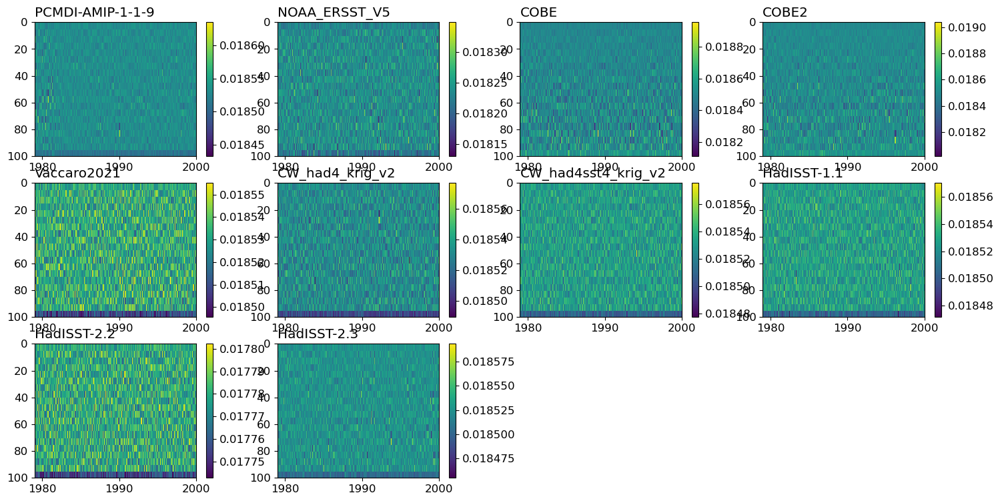

In [11]:
# cnt=0
# bigdata=np.nan*np.ones((10,672,21))
# for dataname in datanames:
#     if 'HadSST4' in dataname or 'Dataset_Mean' in dataname or 'OISST' in dataname:# or 'CW_had' in dataname or 'Vaccaro' in dataname:
#         continue
#     cnt+=1
#     # bigdata[cnt-1,:] = BIN[dataname+'.data']
#     bigdata[cnt-1,:] = BIN[dataname+'.binwts']
# BIGMEAN = np.nanmean(bigdata,0)

plt.figure(figsize=(18,12))
cnt=0
for dataname in datanames:
    if 'HadSST4' in dataname or 'Dataset_Mean' in dataname or 'OISST' in dataname:# or 'CW_had' in dataname or 'Vaccaro' in dataname:
        continue
    cnt+=1
    plt.subplot(4,4,cnt)
    # anom = BIN[dataname+'.data']# - BIGMEAN
    anom = BIN[dataname+'.binwts']# - BIGMEAN
    # plt.pcolor(BIN[dataname+'.yrs'],prctl_binmids,anom[:,1:].T)#,vmin=0.016,vmax=0.02)#,cmap='RdBu_r') 
    plt.pcolor(BIN[dataname+'.yrs'],prctl_binmids,anom[:,1:].T)#,vmin=-0.5,vmax=0.5,cmap='RdBu_r') 
    plt.yticks(np.arange(0,120,20),np.arange(100,-20,-20))
    plt.xticks(np.arange(1950,2030,10),np.arange(1950,2030,10))
    plt.ylim(0,100)
    plt.title(dataname,loc='left') 
    cb=plt.colorbar()
    plt.xlim(1979,2000)
# cnt+=1
# plt.subplot(4,4,cnt)
# anom = BIGMEAN
# plt.pcolor(BIN['PCMDI-AMIP-1-1-9.yrs'],prctl_binmids,anom[:,1:].T)#,vmin=15,vmax=32,cmap='RdBu_r') 
# plt.yticks(np.arange(0,120,20),np.arange(100,-20,-20))
# plt.xticks(np.arange(1950,2030,10),np.arange(1950,2030,10))
# plt.ylim(0,100)
# plt.title('Mean',loc='left') 
# cb=plt.colorbar()
# plt.xlim(1979,2000)

# ax = plt.figure()
# for dataname in datanames:
#     if 'HadSST4' in dataname or 'Dataset_Mean' in dataname or 'OISST' in dataname:# or 'CW_had' in dataname or 'Vaccaro' in dataname:
#         continue
#     anom = BIN[dataname+'.data']# - BIGMEAN
#     data = anom[:,-2]
#     plt.plot(BIN[dataname+'.yrs'],data,label=dataname)
# ax.legend(ncol=1,frameon=False,fontsize=12,loc='center left', bbox_to_anchor=(0.9, 0.5))
# # plt.plot(BIN['PCMDI-AMIP-1-1-9.yrs'],BIGMEAN[:,-2],label=dataname)
# plt.xlim(1990,2000)

In [12]:
# Compute sharp minus flat:
for dataname in list(RAW.keys()):
    RAW[dataname]['smf'] = RAW[dataname]['sharp']-RAW[dataname]['flat']
    SMOOTH[dataname]['smf'] = SMOOTH[dataname]['sharp']-SMOOTH[dataname]['flat']

In [13]:
# Save data to pickle files
for flavor in ['mean','sharp','flat','smf']:
    DATA={}
    DATA['YRS']=YRS
    DATA['RAW']=RAW
    DATA['SMOOTH']=SMOOTH
    import pickle
    filename = '/p/user_pub/climate_work/zelinka1/pattern_effect/sst_'+flavor+'_timeseries.p'
    pickle.dump(DATA, open( filename, "wb" ) )

## Plot individual timeseries of tropical indices in the context of all other datasets

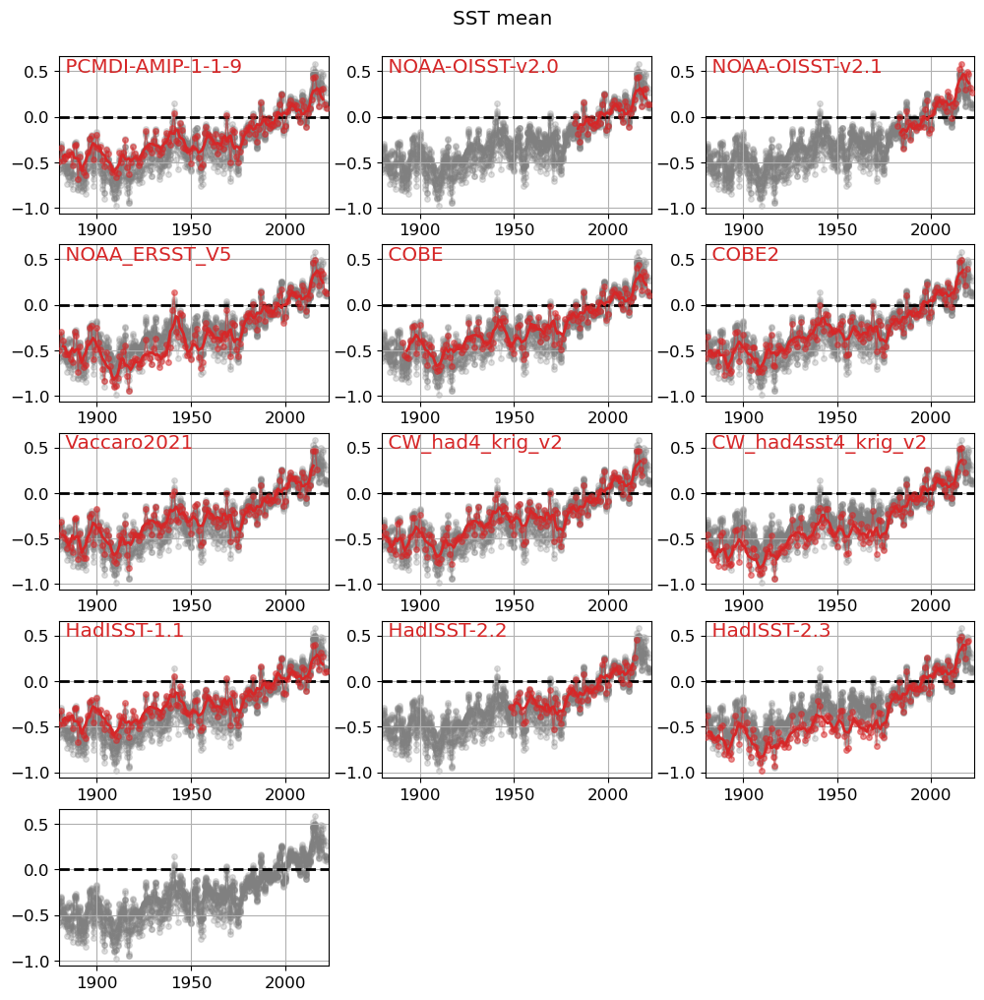

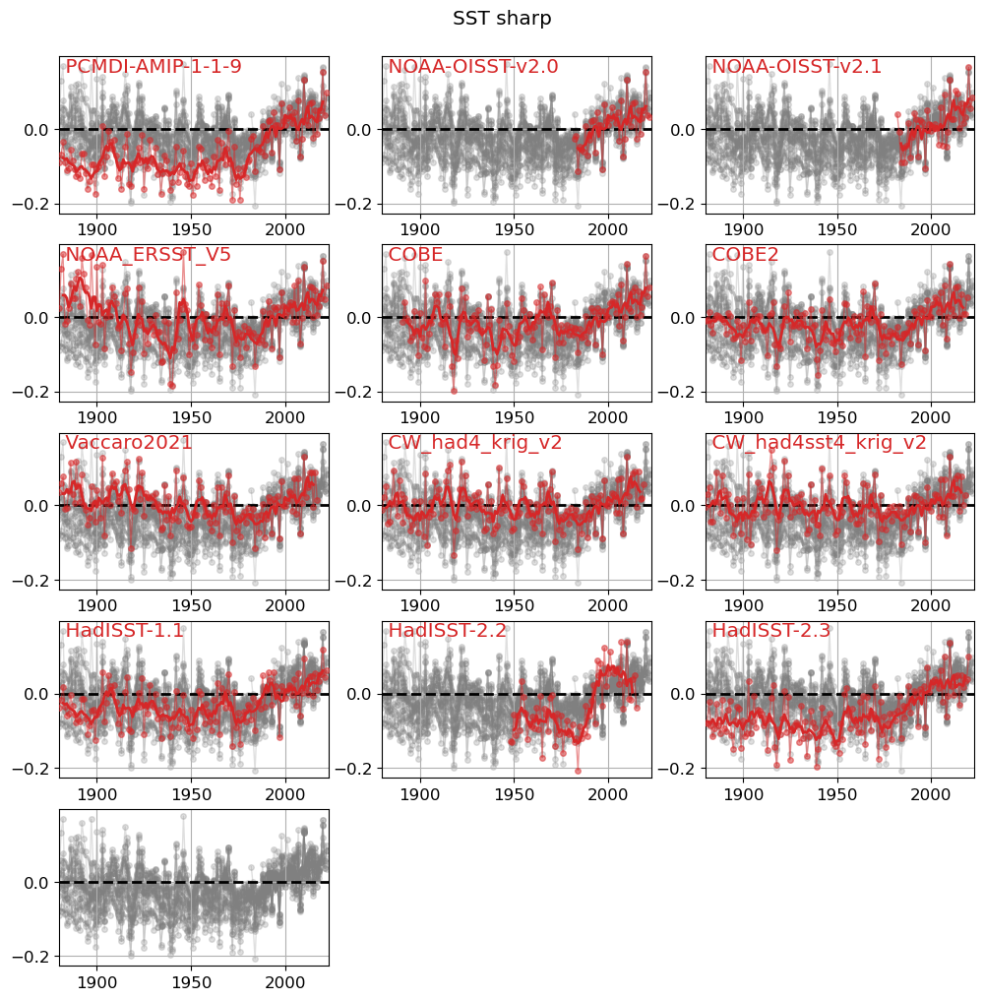

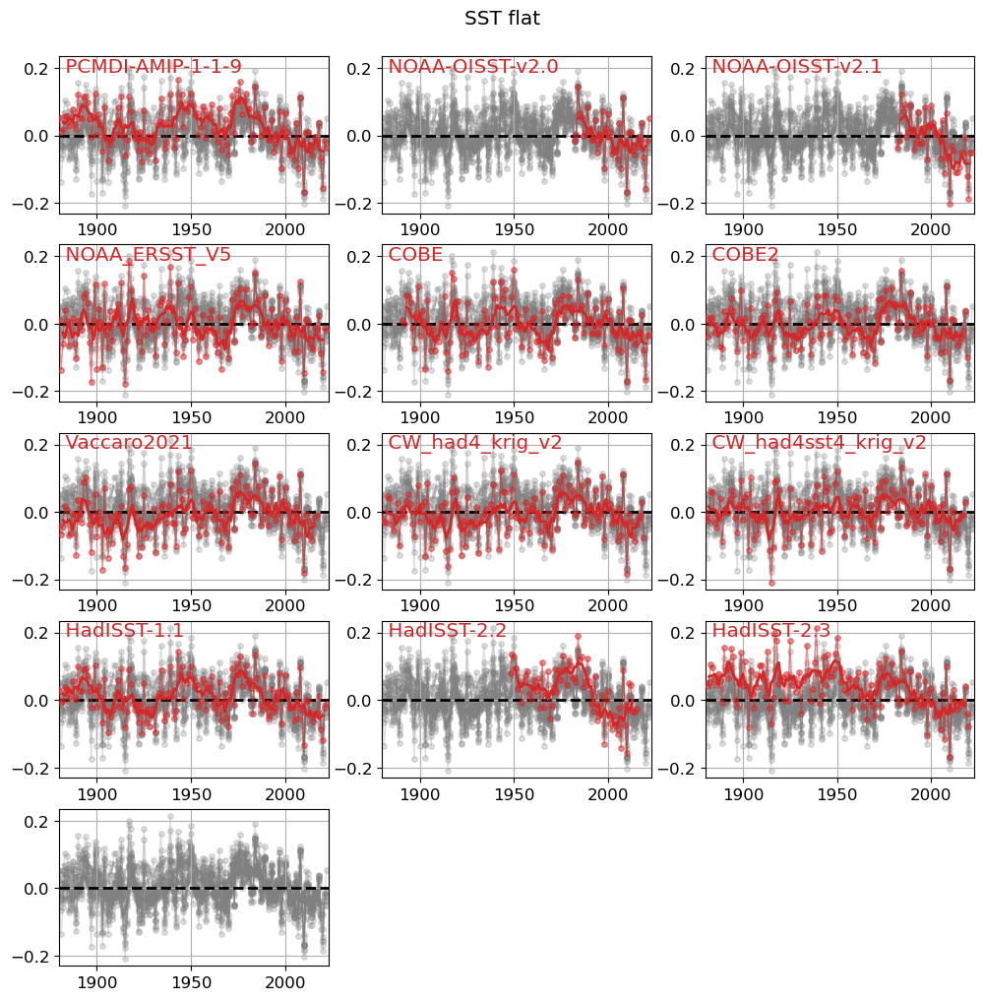

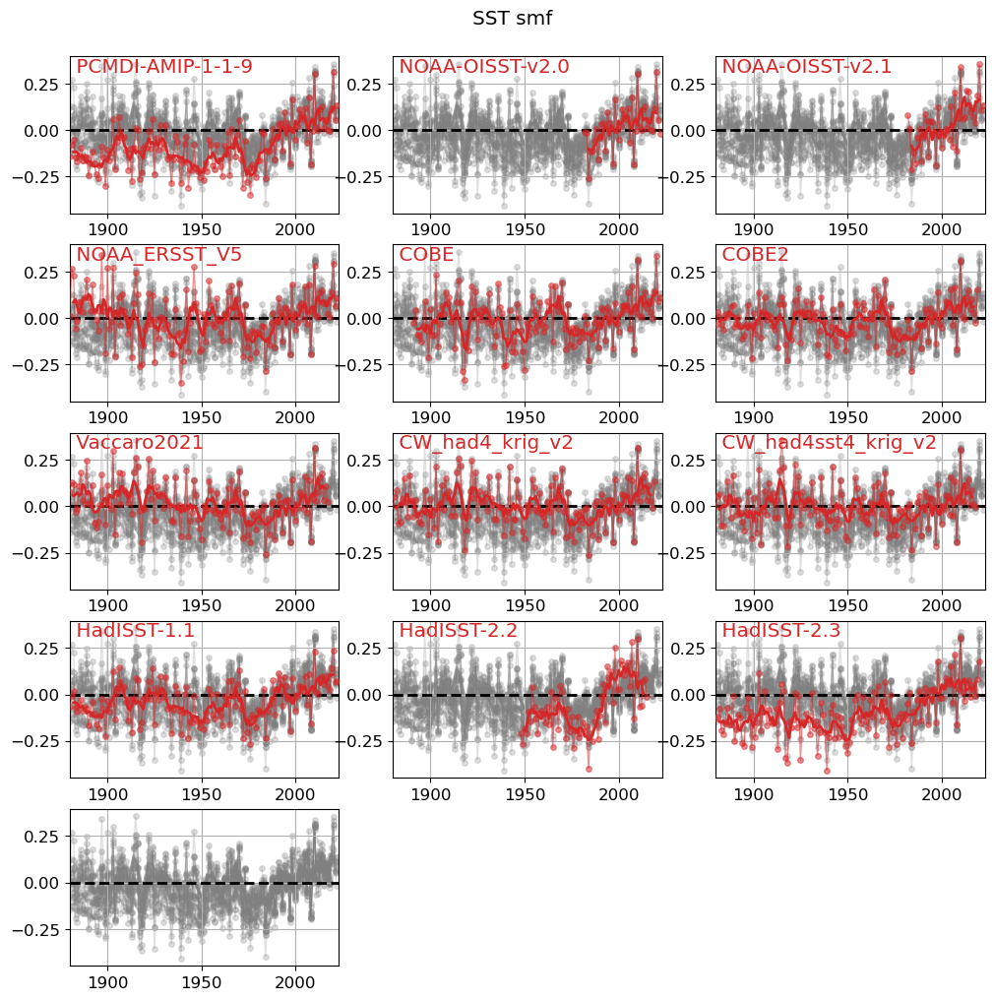

In [14]:
for flavor in ['mean','sharp','flat','smf']:
    plt.figure(figsize=(12,12))
    plt.suptitle('SST '+flavor,y=0.92)
    for cnt in range(len(datanames)):
        plt.subplot(5,3,cnt+1)
        plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
        for dataname in datanames:
            COL,Z,AL = 'gray',0,0.5
            if 'HadSST4' in dataname:
                continue
            if dataname == datanames[cnt]:
                COL,Z,AL = 'C3',10,1
                plt.title(' '+dataname,loc='left',y=0.85,color=COL)
            plt.plot(YRS[dataname],RAW[dataname][flavor],'o-',ms=4,lw=1,color=COL,alpha=0.5*AL,zorder=Z)
            plt.plot(YRS[dataname],SMOOTH[dataname][flavor],color=COL,alpha=AL,zorder=Z)#,label=dataname)
        plt.xlim(1880,2023)
        plt.grid()
    plt.savefig('/home/zelinka1/figures/omip/SST'+flavor+'.pdf',bbox_inches='tight')

## Plot smoothed timeseries of tropical indices

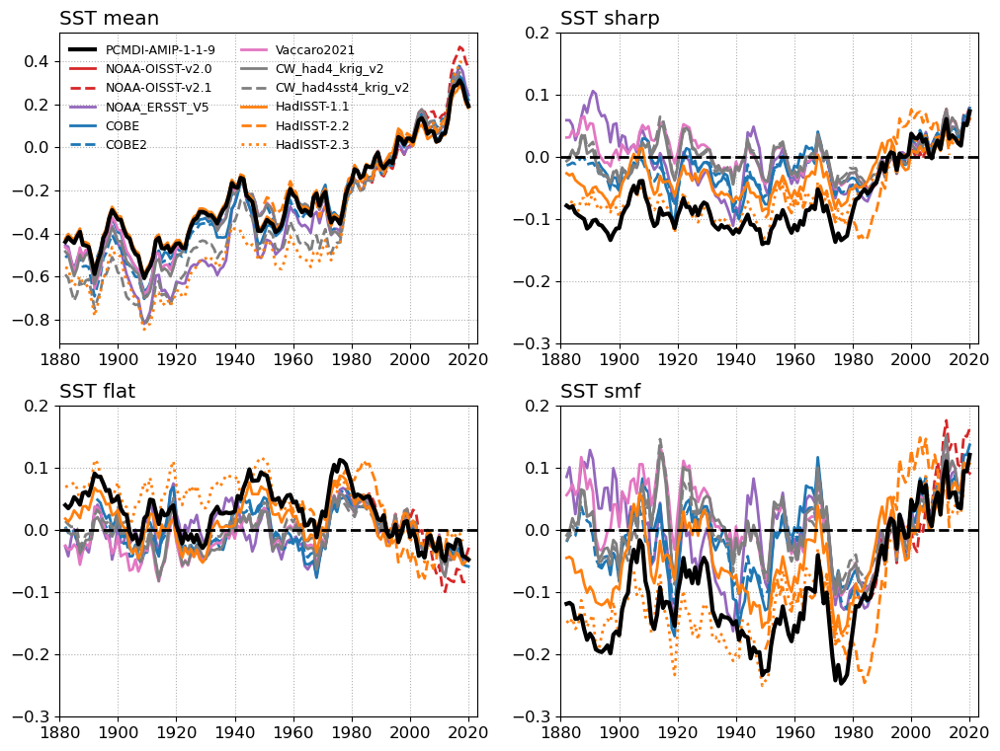

In [15]:
plt.figure(figsize=(12,9))
cnt=0
for flavor in ['mean','sharp','flat','smf']:
    cnt+=1
    plt.subplot(2,2,cnt)
    for d,dataname in enumerate(datanames):
        if 'HadSST4' in dataname:
            continue
#         plt.plot(YRS[dataname],RAW[dataname][flavor],'o',ms=4,color='C'+str(d),alpha=0.5)
#         plt.plot(YRS[dataname],RAW[dataname][flavor],lw=1,color='C'+str(d),alpha=0.5)
        if 'PCMDI' in dataname:
            plt.plot(YRS[dataname],SMOOTH[dataname][flavor],color='k',lw=3,label=dataname,zorder=10)
        else:
            plt.plot(YRS[dataname],SMOOTH[dataname][flavor],color=COLORS[dataname],ls=LINES[dataname],label=dataname)
    plt.xlim(1880,2023)
    if cnt==1:
        plt.legend(ncol=2,fontsize=9,frameon=False)
    else:
        plt.ylim(-0.3,0.2)
        plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
    plt.grid(ls=':')   
    plt.title('SST '+flavor,loc='left')
#     plt.savefig('/home/zelinka1/figures/omip/SST'+flavor+'.pdf',bbox_inches='tight')

## Same as previous, but zoom in on 1960 to present

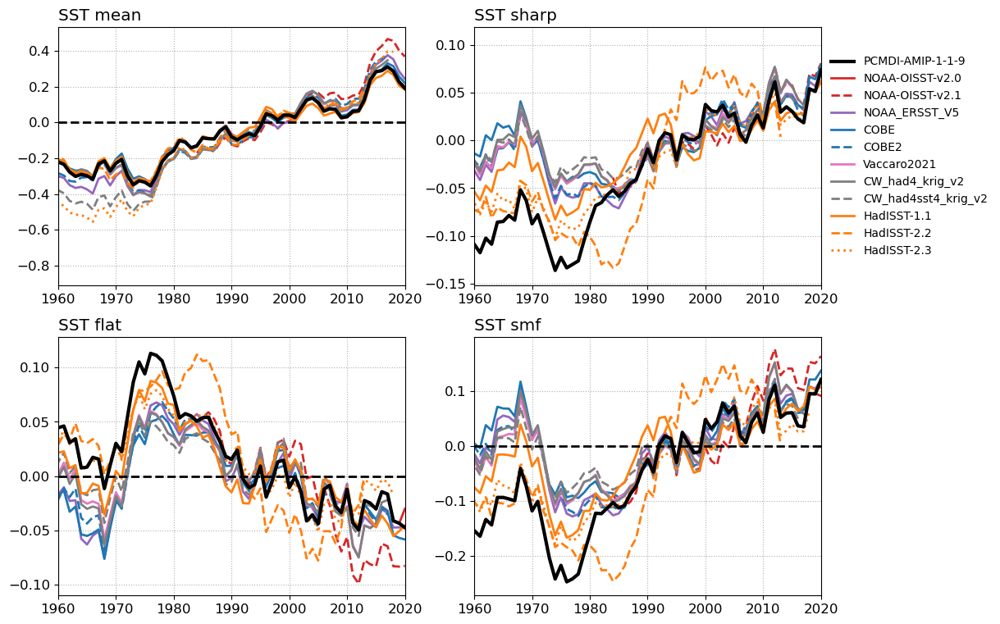

In [16]:
plt.figure(figsize=(12,9))
cnt=0
for flavor in ['mean','sharp','flat','smf']:
    cnt+=1
    plt.subplot(2,2,cnt)
    for d,dataname in enumerate(datanames):
        if 'HadSST4' in dataname:
            continue
        if 'PCMDI' in dataname:
            plt.plot(YRS[dataname],SMOOTH[dataname][flavor],color='k',lw=3,label=dataname,zorder=10)
        else:
            plt.plot(YRS[dataname],SMOOTH[dataname][flavor],color=COLORS[dataname],ls=LINES[dataname],label=dataname)
    plt.xlim(1960,2020)
    if cnt==2:
        # plt.legend(ncol=2,fontsize=9,frameon=False)
        plt.legend(ncol=1,frameon=False,fontsize=10,loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
    plt.grid(ls=':')   
    plt.title('SST '+flavor,loc='left')    

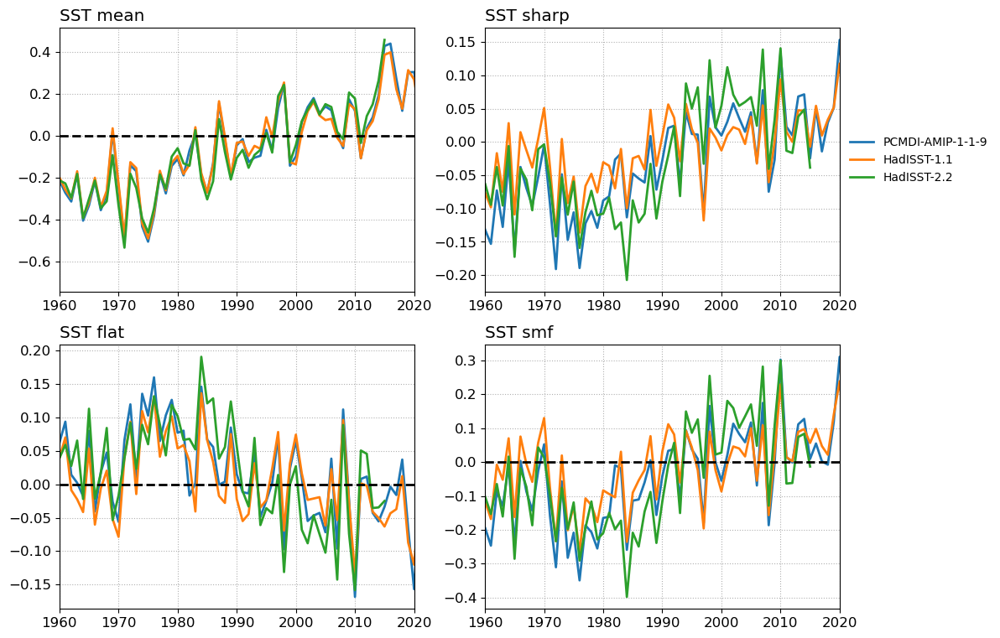

In [17]:
# Same as above, but plot annual means (not smoothed) for a few datasets:
plt.figure(figsize=(12,9))
cnt=0
for flavor in ['mean','sharp','flat','smf']:
    cnt+=1
    plt.subplot(2,2,cnt)
    for d,dataname in enumerate(['PCMDI-AMIP-1-1-9','HadISST-1.1','HadISST-2.2']):
        plt.plot(YRS[dataname],RAW[dataname][flavor],color='C'+str(d),label=dataname)
    plt.xlim(1960,2020)
    if cnt==2:
        plt.legend(ncol=1,frameon=False,fontsize=10,loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        plt.axhline(y=0,color='k',ls='--',label='_nolegend_')
    plt.grid(ls=':')   
    plt.title('SST '+flavor,loc='left')    

## Scatter SST sharp against SST flat

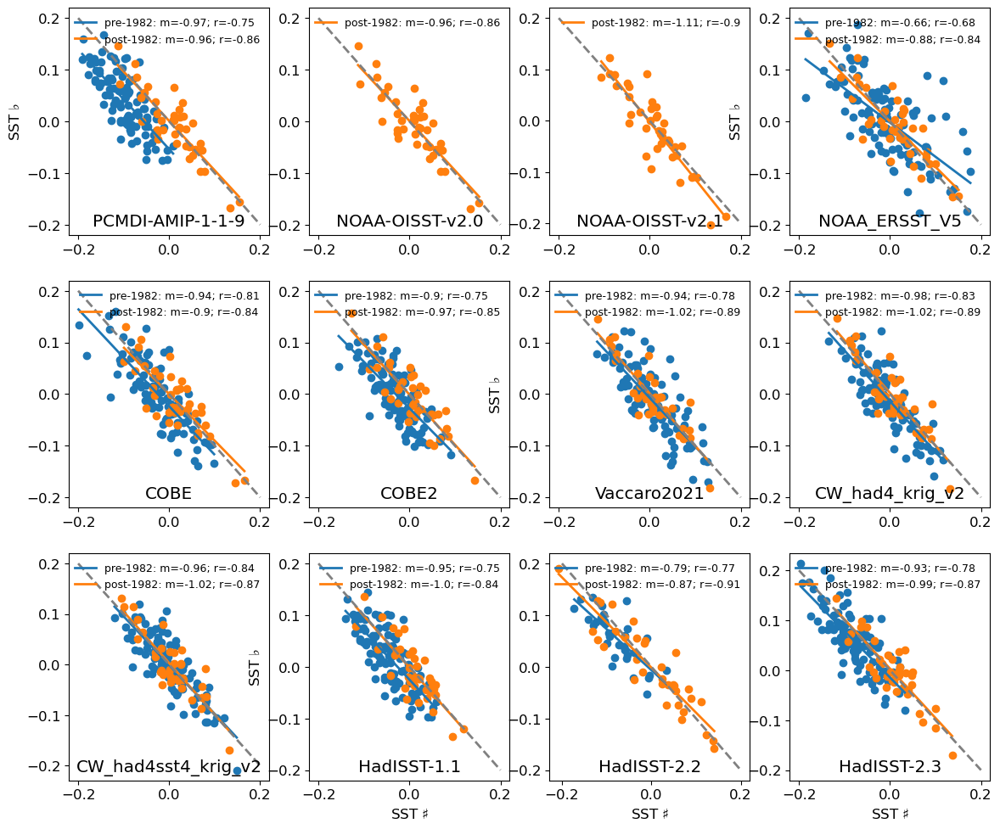

In [18]:
from scipy.stats import linregress
# plot sharp against flat:
plt.figure(figsize=(14,16))
for d,dataname in enumerate(datanames):
    if 'HadSST4' in dataname:
        continue
    early = np.where(YRS[dataname]<1982)
    late = np.where(np.logical_and(YRS[dataname]>=1982,YRS[dataname]<2022))
    plt.subplot(4,4,d+1)
    for p,period in enumerate(['early','late']):
        if period == 'early':
            per = early 
            LAB = 'pre-1982'
        else:
            per = late
            LAB = 'post-1982'
        x = RAW[dataname]['sharp'][per]
        y = RAW[dataname]['flat'][per]
        if len(x)==0:
            continue
        COL = 'C'+str(p)
        plt.scatter(x,y,marker='o',color=COL)
        slope, intercept, r, p, se = linregress(x,y)
        dummy = np.linspace(np.nanmin(x),np.nanmax(x),100)
        plt.plot(dummy,slope*dummy+intercept,lw=2,color=COL,label=LAB+': m='+str(np.round(slope,2))+'; r='+str(np.round(r,2)))
    plt.title(dataname,y=0.01)
    plt.legend(frameon=False,fontsize=9,loc=1)
    if d>8:
        plt.xlabel(r'SST $\sharp$')
    if d==0 or d==3 or d==6 or d==9:
        plt.ylabel(r'SST $\flat$')
    dummy=np.linspace(-0.2,0.2,100)
    plt.plot(dummy,-dummy,'gray',ls='--')
plt.savefig('/home/zelinka1/figures/omip/SSTsharp_v_flat.pdf',bbox_inches='tight')

## Plot PCMDI vs the data comprising it for the two relevant periods
### PCMDI dataset transitions from HadISST to NCEP-OI2/OISST2 from November 1981 onward

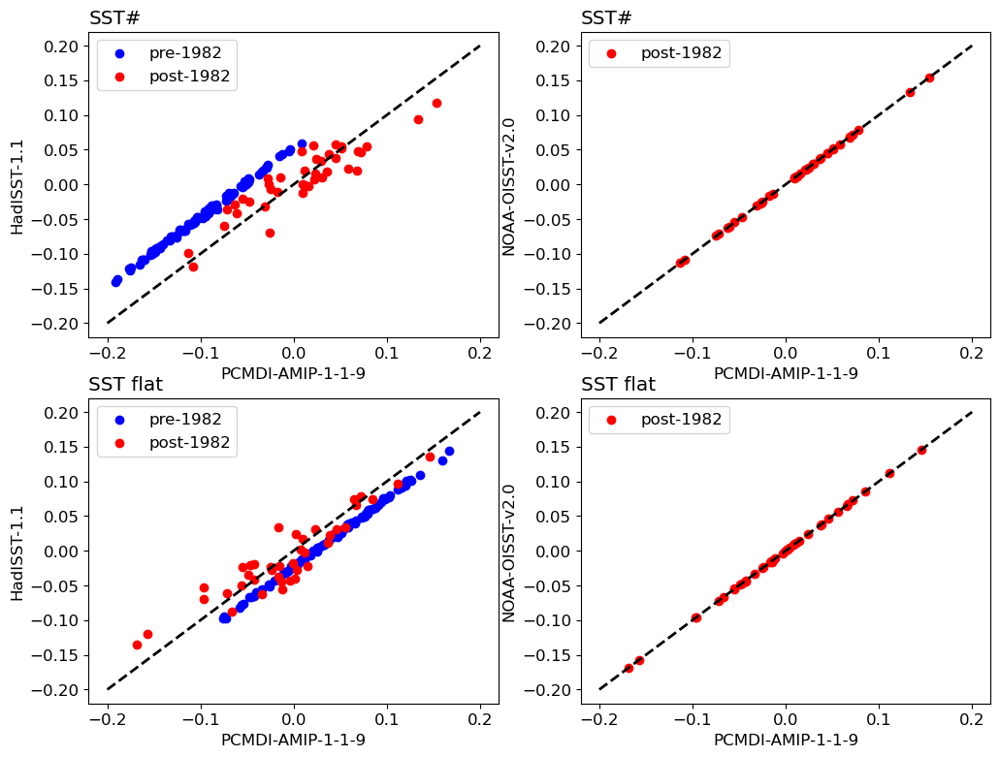

In [19]:
plt.figure(figsize=(12,9))
plt.subplot(2,2,1)
early = np.where(YRS['HadISST-1.1']<1982)
late = np.where(np.logical_and(YRS['HadISST-1.1']>=1982,YRS['HadISST-1.1']<2022))#np.where(YRS['HadISST-1.1']>=1982)
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['sharp'][early],RAW['HadISST-1.1']['sharp'][early],marker='o',color='b',label='pre-1982')
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['sharp'][late],RAW['HadISST-1.1']['sharp'][late],marker='o',color='r',label='post-1982')
plt.legend()
plt.xlabel('PCMDI-AMIP-1-1-9')
plt.ylabel('HadISST-1.1')
plt.title('SST#',loc='left')
dummy=np.linspace(-0.2,0.2,100)
plt.plot(dummy,dummy,'k',ls='--')


plt.subplot(2,2,3)
# early = np.where(YRS['HadISST-1.1']<1982)
# late = np.where(YRS['HadISST-1.1']>=1982)
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['flat'][early],RAW['HadISST-1.1']['flat'][early],marker='o',color='b',label='pre-1982')
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['flat'][late],RAW['HadISST-1.1']['flat'][late],marker='o',color='r',label='post-1982')
plt.legend()
plt.xlabel('PCMDI-AMIP-1-1-9')
plt.ylabel('HadISST-1.1')
plt.title('SST flat',loc='left')
dummy=np.linspace(-0.2,0.2,100)
plt.plot(dummy,dummy,'k',ls='--')

plt.subplot(2,2,2)
# late = len(RAW['NOAA-OISST-v2.0']['sharp'])
# plt.scatter(RAW['PCMDI-AMIP-1-1-9']['sharp'][-late:],RAW['NOAA-OISST-v2.0']['sharp'],marker='o',color='r',label='post-1982')
Nlate = np.where(np.logical_and(YRS['NOAA-OISST-v2.0']>=1982,YRS['NOAA-OISST-v2.0']<2022))
Plate = np.where(np.logical_and(YRS['PCMDI-AMIP-1-1-9']>=1982,YRS['PCMDI-AMIP-1-1-9']<2022))
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['sharp'][Plate],RAW['NOAA-OISST-v2.0']['sharp'][Nlate],marker='o',color='r',label='post-1982')
plt.legend()
plt.xlabel('PCMDI-AMIP-1-1-9')
plt.ylabel('NOAA-OISST-v2.0')
plt.title('SST#',loc='left')
dummy=np.linspace(-0.2,0.2,100)
plt.plot(dummy,dummy,'k',ls='--')

plt.subplot(2,2,4)
plt.scatter(RAW['PCMDI-AMIP-1-1-9']['flat'][Plate],RAW['NOAA-OISST-v2.0']['flat'][Nlate],marker='o',color='r',label='post-1982')
plt.legend()
plt.xlabel('PCMDI-AMIP-1-1-9')
plt.ylabel('NOAA-OISST-v2.0')
plt.title('SST flat',loc='left')
dummy=np.linspace(-0.2,0.2,100)
plt.plot(dummy,dummy,'k',ls='--')
plt.savefig('/home/zelinka1/figures/omip/SSTmetrics_scat.pdf',bbox_inches='tight')


In [20]:
# Concatenate all the data stored in MAPS for each dataset
for n,name in enumerate(datanames):  
    if n==0:
        big = MAPS[name]
    else:
        big = xr.concat([big,MAPS[name]], "dataset")     
MAPS['Dataset_Mean'] = big.mean('dataset')#['trend'] 
datanames.append('Dataset_Mean')

## Plot raw trend maps for all datasets (per decade)

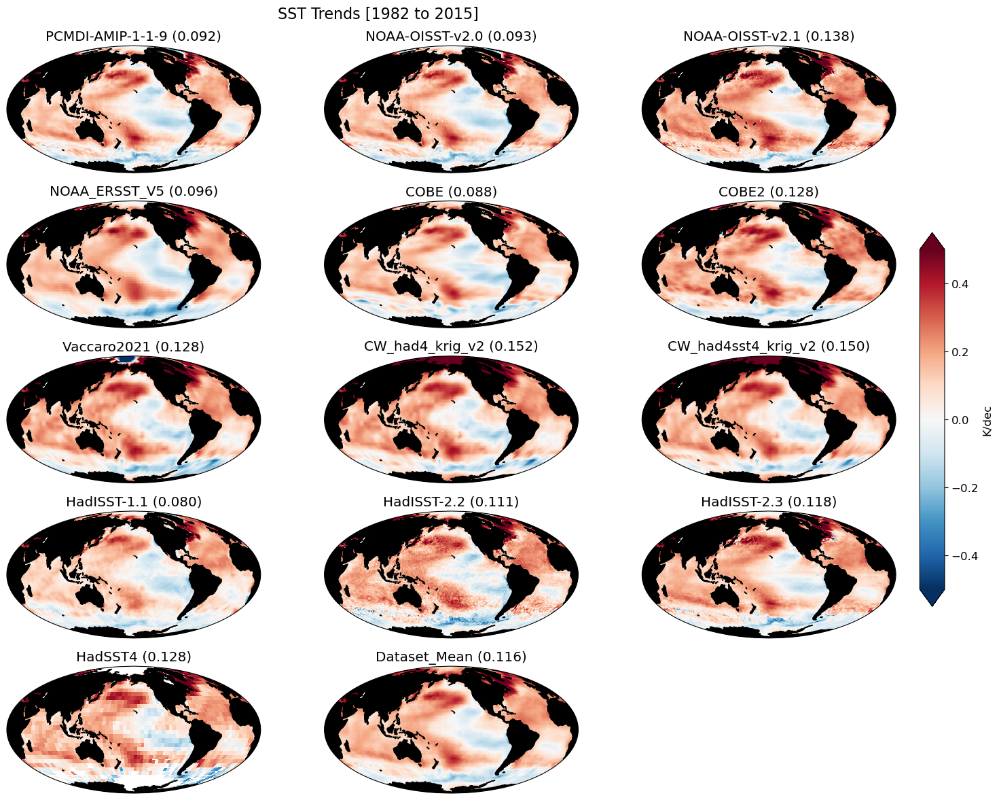

In [21]:
# Plot the raw trends in each dataset
fig = plt.figure(figsize = (18,12))
plt.suptitle('SST Trends ['+trend_slice.start+' to '+trend_slice.stop+']',x=0.4,y=0.98,fontsize=16)
axes = fig.subplots(nrows=5, ncols=3, subplot_kw={'projection': ccrs.Mollweide(central_longitude = -160)})
cnt=-1
GLtrend={}
badcol=[]
for row in range(5):
    for col in range(3):
        cnt+=1
        if cnt>len(datanames)-1:
            badcol.append(col)
            continue
        dataname = datanames[cnt]
        maps = MAPS[dataname]
        GLtrend[dataname] = maps.spatial.average('trend', axis=["X", "Y"])['trend'].values
        pl = maps['trend'].plot(ax = axes[row,col], 
                  transform=ccrs.PlateCarree(),
                  vmin = -0.5, vmax = 0.5, 
                  cmap = 'RdBu_r', 
                  add_colorbar=False)
        axes[row,col].set_title(dataname+" (" + f'{GLtrend[dataname]:.3f}' + ")")
        axes[row,col].add_feature(cartopy.feature.LAND,zorder=100, color='black')
#         gl = axes[row,col].gridlines(draw_labels='y')
#         gl.right_labels = False
plt.tight_layout()#h_pad=-2)#w_pad=2.5)#,)        
fig.colorbar(pl, ax=axes.ravel().tolist(), pad = 0.02, shrink = 0.5, aspect = 15,extend = 'both',label='K/dec')
for col in badcol:
    plt.delaxes(ax=axes[row,col])

## Plot the trends in each dataset as deviations from multi-dataset mean (per decade)

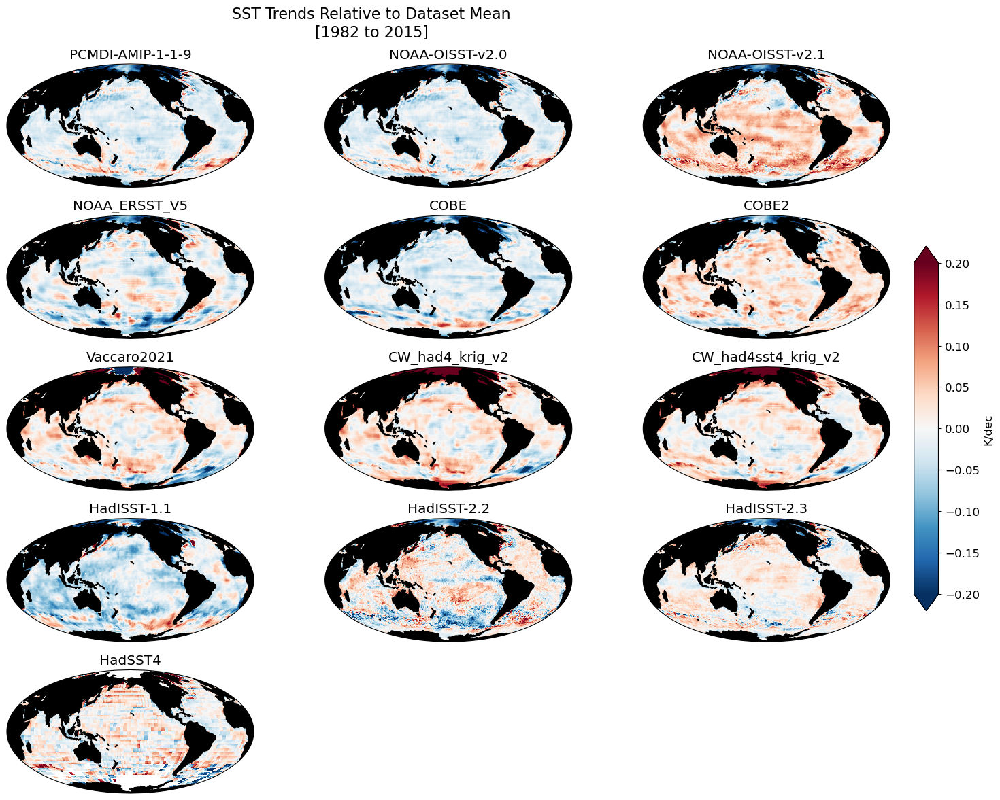

In [22]:
fig = plt.figure(figsize = (18,12))
plt.suptitle('SST Trends Relative to Dataset Mean\n['+trend_slice.start+' to '+trend_slice.stop+']',x=0.4,y=0.98,fontsize=16)
axes = fig.subplots(nrows=5, ncols=3, subplot_kw={'projection': ccrs.Mollweide(central_longitude = -160)})
cnt=-1
badcol=[]
for row in range(5):
    for col in range(3):
        cnt+=1
        if cnt>len(datanames)-1:
            badcol.append(col)
            continue
        dataname = datanames[cnt]
        if dataname=='Dataset_Mean':
            badcol.append(col)
            continue
        maps = MAPS[dataname]['trend'] - MAPS['Dataset_Mean']['trend']
        pl = maps.plot(ax = axes[row,col], 
                  transform=ccrs.PlateCarree(),
                  vmin = -0.2, vmax = 0.2, 
                  cmap = 'RdBu_r', 
                  add_colorbar=False)
        axes[row,col].set_title(dataname)#+" (" + f'{GLtrend:.3f}' + ")")
        axes[row,col].add_feature(cartopy.feature.LAND,zorder=100, color='black')
#         gl = axes[row,col].gridlines(draw_labels='y')
#         gl.right_labels = False
plt.tight_layout()#h_pad=-2)#w_pad=2.5,) 
fig.colorbar(pl, ax=axes.ravel().tolist(), pad = 0.02, shrink = 0.5, aspect = 15,extend = 'both', label='K/dec')
for col in badcol:
    plt.delaxes(ax=axes[row,col])

## Plot raw trend maps for all datasets (per K)

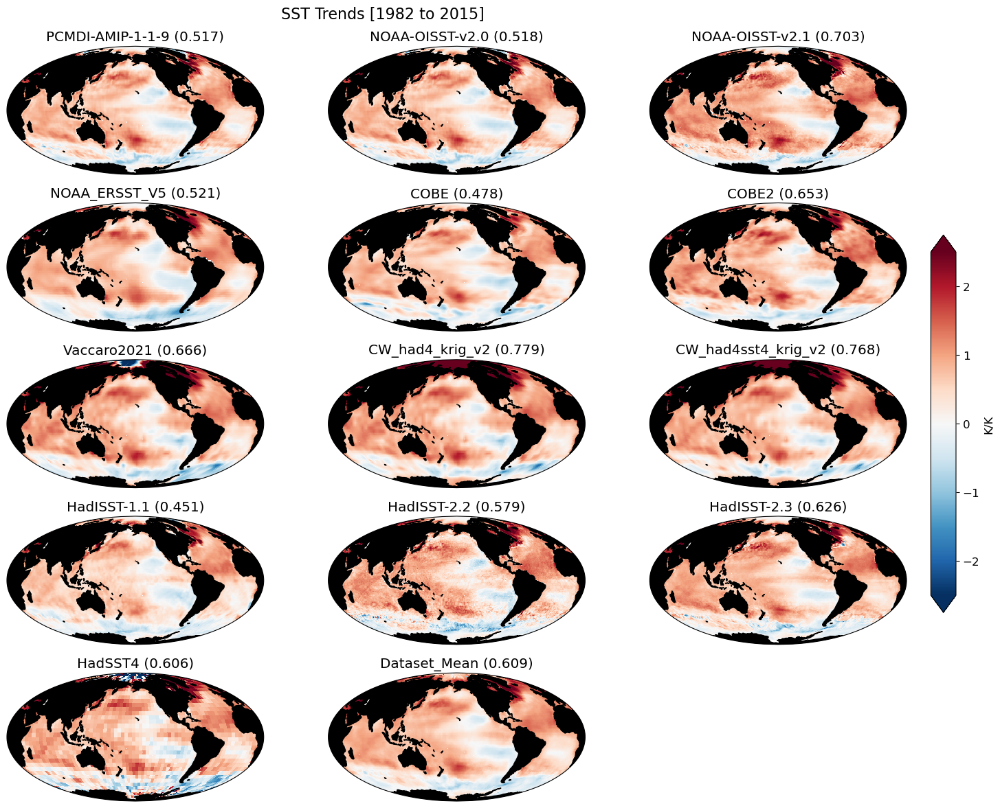

In [23]:
# Plot the raw "feedbacks" in each dataset
fig = plt.figure(figsize = (18,12))
plt.suptitle('SST Trends ['+trend_slice.start+' to '+trend_slice.stop+']',x=0.4,y=0.98,fontsize=16)
axes = fig.subplots(nrows=5, ncols=3, subplot_kw={'projection': ccrs.Mollweide(central_longitude = -160)})
cnt=-1
GLfbk={}
badcol=[]
for row in range(5):
    for col in range(3):
        cnt+=1
        if cnt>len(datanames)-1:
            badcol.append(col)
            continue
        dataname = datanames[cnt]
        maps = MAPS[dataname]
        GLfbk[dataname] = maps.spatial.average('fbk', axis=["X", "Y"])['fbk'].values
        pl = maps['fbk'].plot(ax = axes[row,col], 
                  transform=ccrs.PlateCarree(),
                  vmin = -2.5, vmax = 2.5, 
                  cmap = 'RdBu_r', 
                  add_colorbar=False)
        axes[row,col].set_title(dataname+" (" + f'{GLfbk[dataname]:.3f}' + ")")
        axes[row,col].add_feature(cartopy.feature.LAND,zorder=100, color='black')
plt.tight_layout()
fig.colorbar(pl, ax=axes.ravel().tolist(), pad = 0.02, shrink = 0.5, aspect = 15,extend = 'both',label='K/K')
for col in badcol:
    plt.delaxes(ax=axes[row,col])

## Plot the trends in each dataset as deviations from multi-dataset mean (per K)

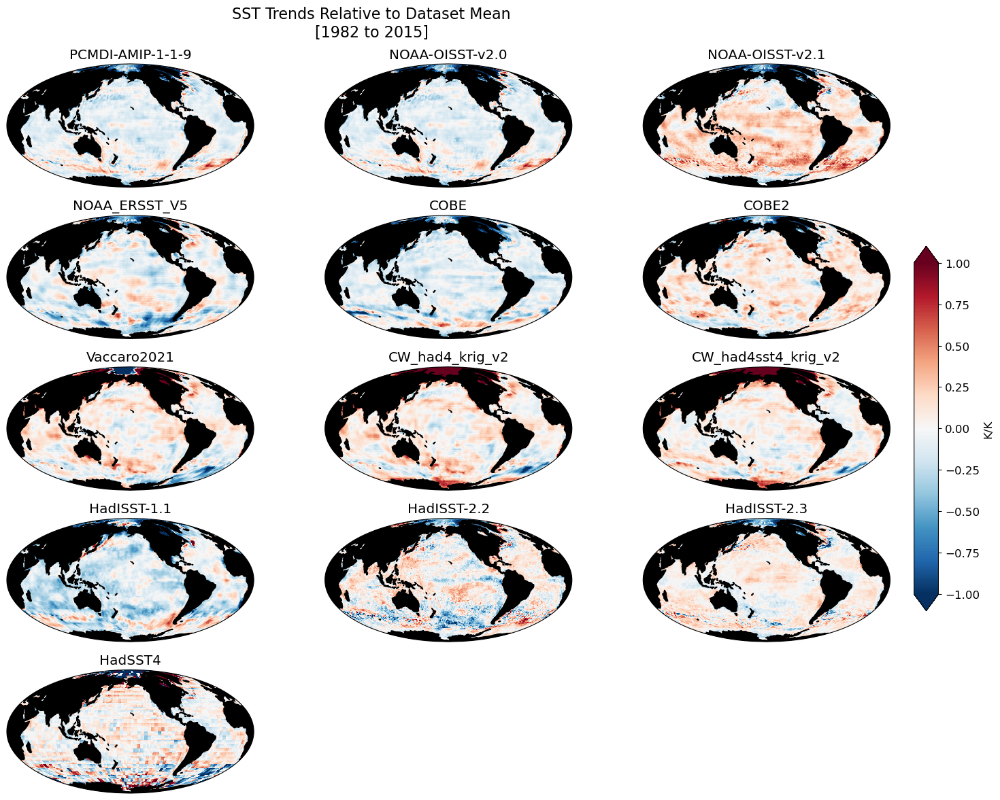

In [24]:
# same, but in per Kelvin units:
fig = plt.figure(figsize = (18,12))
plt.suptitle('SST Trends Relative to Dataset Mean\n['+trend_slice.start+' to '+trend_slice.stop+']',x=0.4,y=0.98,fontsize=16)
axes = fig.subplots(nrows=5, ncols=3, subplot_kw={'projection': ccrs.Mollweide(central_longitude = -160)})
cnt=-1
badcol=[]
for row in range(5):
    for col in range(3):
        cnt+=1
        if cnt>len(datanames)-1:
            badcol.append(col)
            continue
        dataname = datanames[cnt]
        if dataname=='Dataset_Mean':
            badcol.append(col)
            continue
        maps = MAPS[dataname]['fbk'] - MAPS['Dataset_Mean']['fbk']
        pl = maps.plot(ax = axes[row,col], 
                  transform=ccrs.PlateCarree(),
                  vmin = -1, vmax = 1, 
                  cmap = 'RdBu_r', 
                  add_colorbar=False)
        axes[row,col].set_title(dataname)#+" (" + f'{GLtrend:.3f}' + ")")
        axes[row,col].add_feature(cartopy.feature.LAND,zorder=100, color='black')
plt.tight_layout()#h_pad=-2)
fig.colorbar(pl, ax=axes.ravel().tolist(), pad = 0.02, shrink = 0.5, aspect = 15,extend = 'both', label='K/K')
for col in badcol:
    plt.delaxes(ax=axes[row,col])


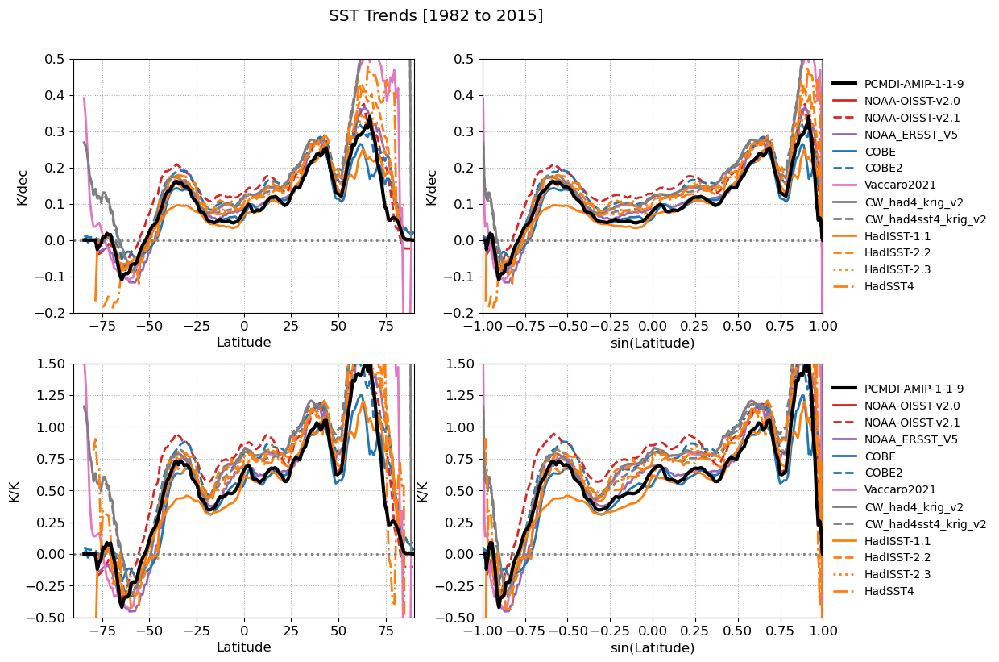

In [25]:
# Zonal means:
plt.figure(figsize=(12,9))
plt.suptitle('SST Trends ['+trend_slice.start+' to '+trend_slice.stop+']',y=0.95)
cnt=0
for feature in ['trend','fbk']:
    cnt+=1
    ax = plt.subplot(2,2,cnt)
    for dataname in datanames[:-1]:
        maps = MAPS[dataname]
        Zavg = maps.spatial.average(feature, axis=["X"])[feature].values
        if dataname == 'PCMDI-AMIP-1-1-9':
            plt.plot(maps.lat,Zavg,color='k',lw=3,label=dataname,zorder=10)    
        else:
            plt.plot(maps.lat,Zavg,color=COLORS[dataname],ls=LINES[dataname],label=dataname)
    plt.axhline(y=0,color='gray',ls=':')
    plt.xlim(-90,90)
    plt.xlabel('Latitude')
    if feature=='trend':
        plt.ylabel('K/dec')
        plt.ylim(-0.2,0.5)
    else:
        plt.ylabel('K/K')
        plt.ylim(-0.5,1.5)
    plt.grid(ls=':')
    # ax.legend(ncol=1,frameon=False,fontsize=10,loc='center left', bbox_to_anchor=(1, 0.5))

    cnt+=1
    ax = plt.subplot(2,2,cnt)
    for dataname in datanames[:-1]:
        maps = MAPS[dataname]
        Zavg = maps.spatial.average(feature, axis=["X"])[feature].values
        if dataname == 'PCMDI-AMIP-1-1-9':
            plt.plot(np.sin(np.pi*maps.lat/180),Zavg,color='k',lw=3,label=dataname,zorder=10)    
        else:
            plt.plot(np.sin(np.pi*maps.lat/180),Zavg,color=COLORS[dataname],ls=LINES[dataname],label=dataname)
    plt.axhline(y=0,color='gray',ls=':')
    plt.ylim(-0.2,0.5)
    plt.xlim(-1,1)
    plt.xlabel('sin(Latitude)')
    if feature=='trend':
        plt.ylabel('K/dec')
        plt.ylim(-0.2,0.5)
    else:
        plt.ylabel('K/K')
        plt.ylim(-0.5,1.5)
    plt.grid(ls=':')
    ax.legend(ncol=1,frameon=False,fontsize=10,loc='center left', bbox_to_anchor=(1, 0.5))



## Plot zonal mean SST trends as a function of start year for windows ending in 2019

Vaccaro2021 data ends before 2019
CW_had4sst4_krig_v2 data ends before 2019
HadISST-2.2 data ends before 2019


/tmp/ipykernel_246594/2064163154.py:39: RuntimeWarning: Mean of empty slice
  ZMEAN = np.nanmean(Ztrend,0)


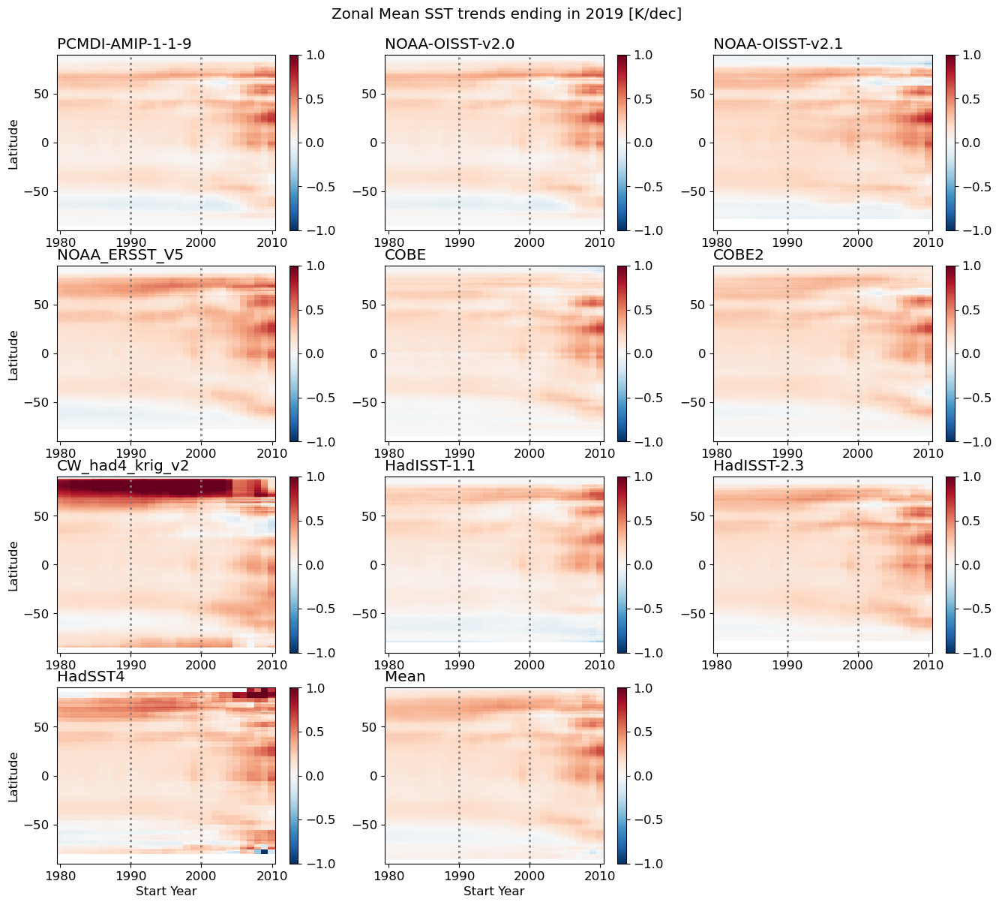

In [26]:
stwin = 1980
endyr = 2019
LW = 2011-stwin
fig = plt.figure(figsize=(16,14))
plt.suptitle('Zonal Mean SST trends ending in '+str(endyr)+' [K/dec]',y=0.925)
cnt=-1
Ztrend=np.nan*np.ones((10,LW,180))
Gtrend=np.nan*np.ones((10,LW))
names=[]
for d,dataname in enumerate(datanames):
    if dataname=='Dataset_Mean':
        continue
    Zavg = MAPS[dataname].spatial.average('annmap', axis=["X"])['annmap']
    Gavg = MAPS[dataname].spatial.average('annmap', axis=["X","Y"])['annmap']
    if Zavg.year[-1]<endyr:
        print(dataname+' data ends before '+str(endyr))
        continue
    cnt+=1
    for s,styr in enumerate(range(stwin,2011)):
        y = Zavg.sel(year=slice(str(styr),str(endyr)))
        Gy = Gavg.sel(year=slice(str(styr),str(endyr)))
        x = y.year
        Ztrend[cnt,s,:] = 10*xss.linslope(x, y, dim='year', weights=None, keep_attrs=True)#, skipna=True # per decade       
        Gtrend[cnt,s] = 10*xss.linslope(x, Gy, dim='year', weights=None, keep_attrs=True)#, skipna=True # per decade       
    plt.subplot(4,3,cnt+1)
    plt.pcolor(np.arange(stwin,2011),Zavg.lat,Ztrend[cnt,:].T,vmin=-1,vmax=1,cmap='RdBu_r')
    plt.ylim(-90,90)
    if cnt==0 or cnt==3 or cnt==6 or cnt==9:
        plt.ylabel('Latitude')
    if cnt>=9:
        plt.xlabel('Start Year')
    plt.title(dataname,loc='left')
    plt.axvline(x=1990,ls=':',color='gray')
    plt.axvline(x=2000,ls=':',color='gray')
    plt.colorbar()
    names.append(dataname)
    
# Compute multi-dataset mean:
ZMEAN = np.nanmean(Ztrend,0)
cnt+=1
plt.subplot(4,3,cnt+1)
plt.pcolor(np.arange(stwin,2011),Zavg.lat,ZMEAN.T,vmin=-1,vmax=1,cmap='RdBu_r')
plt.ylim(-90,90)
plt.xlabel('Start Year')
plt.title('Mean',loc='left')
plt.axvline(x=1990,ls=':',color='gray')
plt.axvline(x=2000,ls=':',color='gray')
plt.colorbar()
plt.savefig('/home/zelinka1/figures/omip/ZSSTtrends_f_styr.pdf',bbox_inches='tight')

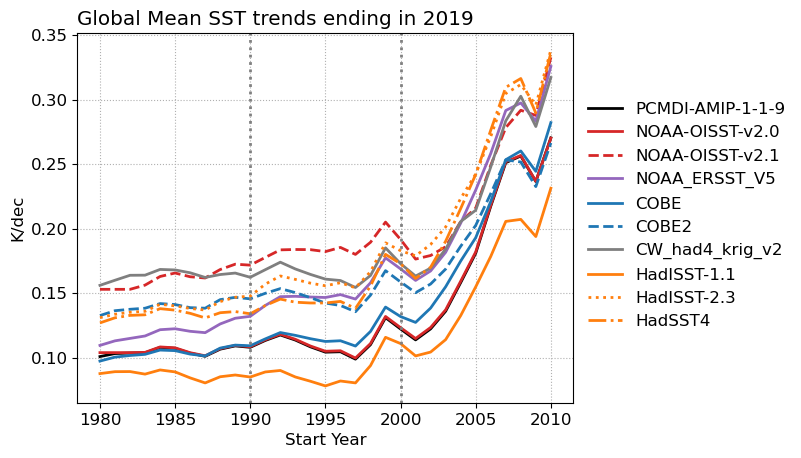

In [27]:
ax=plt.figure()
for d,dataname in enumerate(names):
    A=1#0.25
    if 'PCMDI' in dataname or 'ERSST' in dataname or 'HadSST4' in dataname:
        A=1
    plt.plot(np.arange(stwin,2011),Gtrend[d,:],color=COLORS[dataname],ls=LINES[dataname],label=dataname,alpha=A)
plt.xlabel('Start Year')
plt.ylabel('K/dec')
plt.title('Global Mean SST trends ending in '+str(endyr),loc='left')
plt.axvline(x=1990,ls=':',color='gray')
plt.axvline(x=2000,ls=':',color='gray')
plt.grid(ls=':')
_=ax.legend(ncol=1,frameon=False,fontsize=12,loc='center left', bbox_to_anchor=(0.9, 0.5))
plt.savefig('/home/zelinka1/figures/omip/GSSTtrends_f_styr.pdf',bbox_inches='tight')

## Same as previous, but expressed as deviation from the PCMDI AMIP

Vaccaro2021 data ends before 2019
CW_had4sst4_krig_v2 data ends before 2019
HadISST-2.2 data ends before 2019


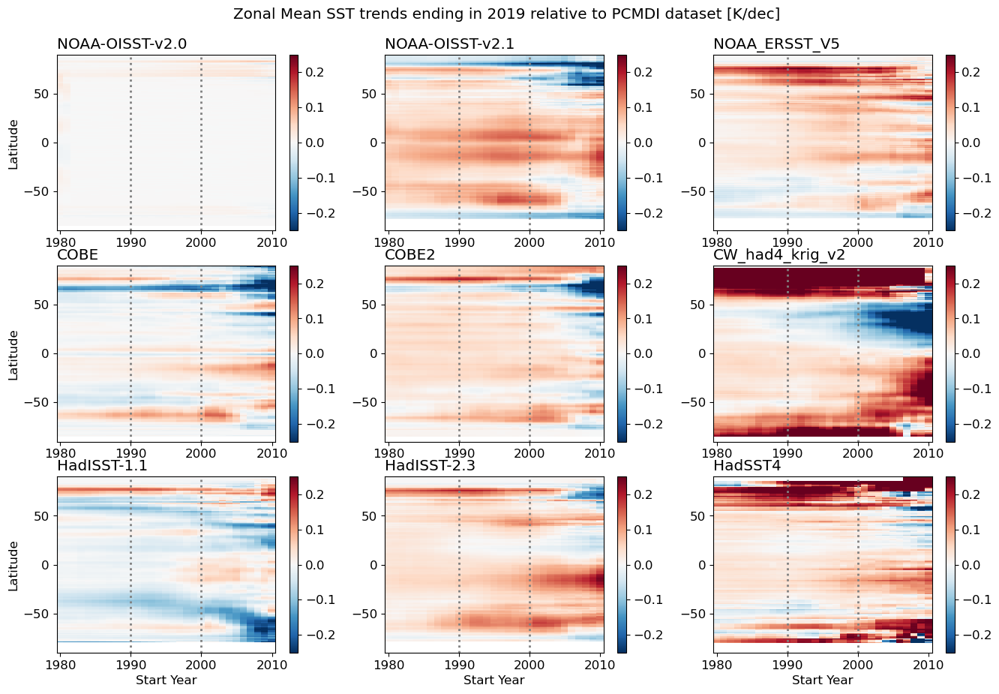

In [28]:
fig = plt.figure(figsize=(16,14))
ZMEAN = Ztrend[0,:] # deviations from PCMDI
plt.suptitle('Zonal Mean SST trends ending in '+str(endyr)+' relative to PCMDI dataset [K/dec]',y=0.925)
# plt.suptitle('Zonal Mean SST trends ending in '+str(endyr)+' relative to dataset mean [K/dec]',y=0.925)
cnt=-1   
Ztrend=np.nan*np.ones((10,LW,180))
for d,dataname in enumerate(datanames):
    if dataname=='Dataset_Mean' or 'PCMDI' in dataname:
        continue
    Zavg = MAPS[dataname].spatial.average('annmap', axis=["X"])['annmap']#[feature].values
    if Zavg.year[-1]<endyr:
        print(dataname+' data ends before '+str(endyr))
        continue
    cnt+=1
    for s,styr in enumerate(range(stwin,2011)):
        y = Zavg.sel(year=slice(str(styr),str(endyr)))
        x = y.year
        Ztrend[cnt,s,:] = 10*xss.linslope(x, y, dim='year', weights=None, keep_attrs=True)#, skipna=True # per decade       
    plt.subplot(4,3,cnt+1)
    data = Ztrend[cnt,:] - ZMEAN
    plt.pcolor(np.arange(stwin,2011),Zavg.lat,data.T,vmin=-0.25,vmax=0.25,cmap='RdBu_r')
    plt.ylim(-90,90)
    if cnt==0 or cnt==3 or cnt==6 or cnt==9:
        plt.ylabel('Latitude')
    if cnt>=6:
        plt.xlabel('Start Year')
    plt.title(dataname,loc='left')
    plt.axvline(x=1990,ls=':',color='gray')
    plt.axvline(x=2000,ls=':',color='gray')
    plt.colorbar()
plt.savefig('/home/zelinka1/figures/omip/ZSSTtrends_f_styr_dev.pdf',bbox_inches='tight')

## How much do these differences matter for implied feedbacks?
### Assess by convolving with Green's Functions

In [29]:
gf0 = xc.open_dataset('/home/zelinka1/git/greens-function/data/Zhou_etal_2017_GreensFunction.nc')
gflat = np.array(gf0.lat)
gflon = np.array(gf0.lon)
gfgrid = xc.regridder.grid.create_grid(lat=gflat, lon=gflon)

# plt.figure(figsize=(12,12))
# cnt=0
GF={}
for var in gf0.data_vars:
    if 'bounds' in var:
        continue
    gf = gf0.regridder.horizontal(var, gfgrid, tool='xesmf', method='conservative')#'bilinear')
    GF[var] = gf[var]
    # cnt+=1
    # plt.subplot(3,2,cnt)
    # plt.pcolor(gflon,gflat,gf[var],vmin=-0.002,vmax=0.002,cmap='RdBu_r')
    # plt.title(var)
    # plt.colorbar()

2023-05-23 09:11:17,161 [WARNING]: dataset.py(open_dataset:109) >> "No time coordinates were found in this dataset to decode. If time coordinates were expected to exist, make sure they are detectable by setting the CF 'axis' or 'standard_name' attribute (e.g., ds['time'].attrs['axis'] = 'T' or ds['time'].attrs['standard_name'] = 'time'). Afterwards, try decoding again with `xcdat.decode_time`."


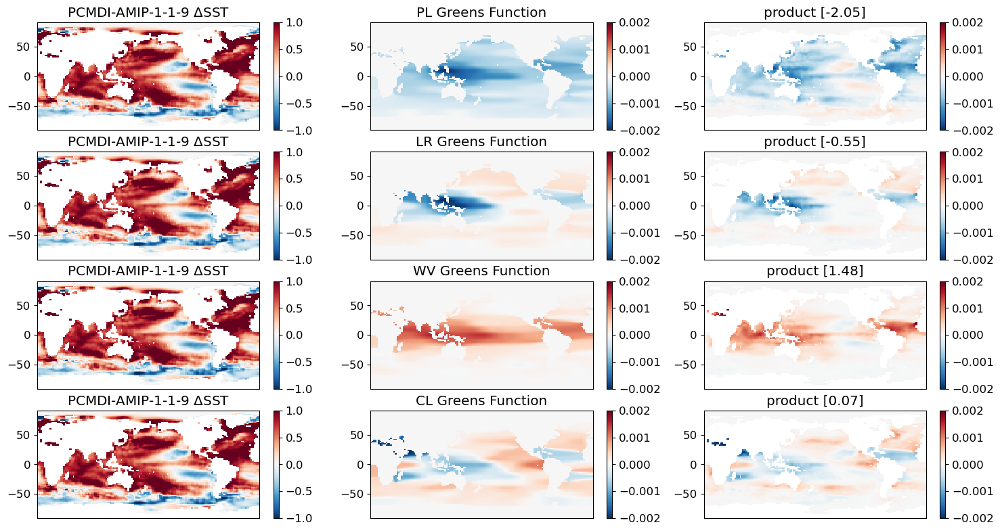

In [30]:
plt.figure(figsize=(18,12))
bigvector=[]
for X,dataname in enumerate(datanames):
    # SSTtrend = MAPS[dataname]['fbk']   
    SSTtrend = MAPS[dataname].regridder.horizontal('fbk', gfgrid, tool='xesmf', method='conservative')['fbk']   
    # prod = SSTtrend*GF['TS']
    # denom = prod.sum().values
    vector=[]
    variables = list(GF.keys())
    cnt=0
    for v,var in enumerate(variables[1:-1]):
        prod = SSTtrend*GF[var]
        vector.append(prod.sum().values)
        # vector.append(prod.sum().values/denom)
        if X==0:
            cnt+=1
            plt.subplot(5,3,cnt)
            plt.pcolor(gflon,gflat,SSTtrend,vmin=-1,vmax=1,cmap='RdBu_r')
            plt.title(dataname+' $\Delta$SST')
            plt.colorbar()
            plt.xticks([])
            cnt+=1
            plt.subplot(5,3,cnt)
            plt.pcolor(gflon,gflat,GF[var],vmin=-0.002,vmax=0.002,cmap='RdBu_r')
            plt.title(var+ ' Greens Function')
            plt.colorbar()
            plt.xticks([])
            cnt+=1
            plt.subplot(5,3,cnt)
            plt.pcolor(gflon,gflat,prod,vmin=-0.002,vmax=0.002,cmap='RdBu_r')
            plt.title('product ['+str(np.round(prod.sum().values,2))+']')
            plt.colorbar()
            plt.xticks([])
    bigvector.append(np.sum(np.array(vector)))
a = np.argsort(np.array(bigvector))[-1::-1]


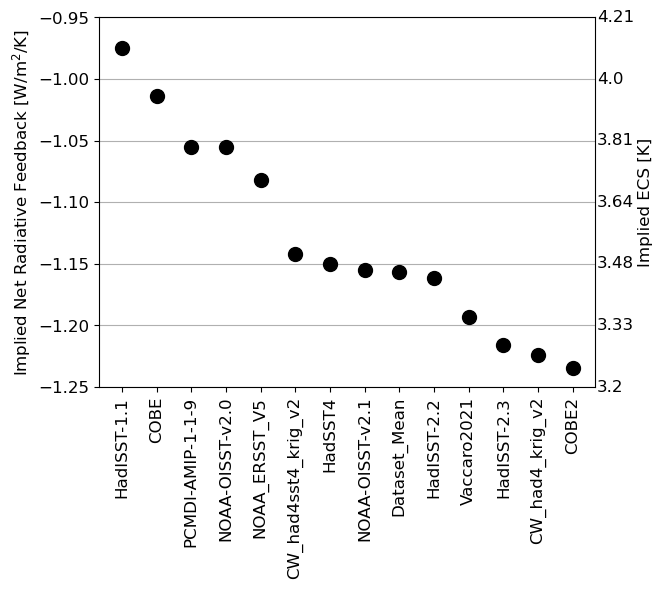

In [31]:
fig, ax = plt.subplots()
plt.plot(np.arange(len(a)),np.array(bigvector)[a],'o',mec='k',mfc='k',ms=10,zorder=20)
out = np.array(datanames)[a.astype(int)]
plt.xticks(np.arange(len(a)),out,rotation=90)
plt.grid(axis='y')
plt.ylim(-1.25,-0.95)
for yloc in np.arange(-1.25,-0.9,0.05):
    plt.text(len(a)-0.3,yloc,str(np.round(-4/yloc,2)),ha='left',va='center')
plt.ylabel('Implied Net Radiative Feedback [W/m$^2$/K]')
_=plt.text(len(a)+1.1,-(1.25+0.95)/2,'Implied ECS [K]',rotation=90,ha='center',va='center')

In [32]:
def stacked_barplot(x,y,WIDTH,negavg,posavg,COLOR,ALPHA,ZORDER,LABEL):
    if y<0:
        p1 = plt.bar(x, y, width=WIDTH, bottom=negavg, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        negavg+=y
    else:         
        p1 = plt.bar(x, y, width=WIDTH, bottom=posavg, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        posavg+=y
    return(negavg,posavg)

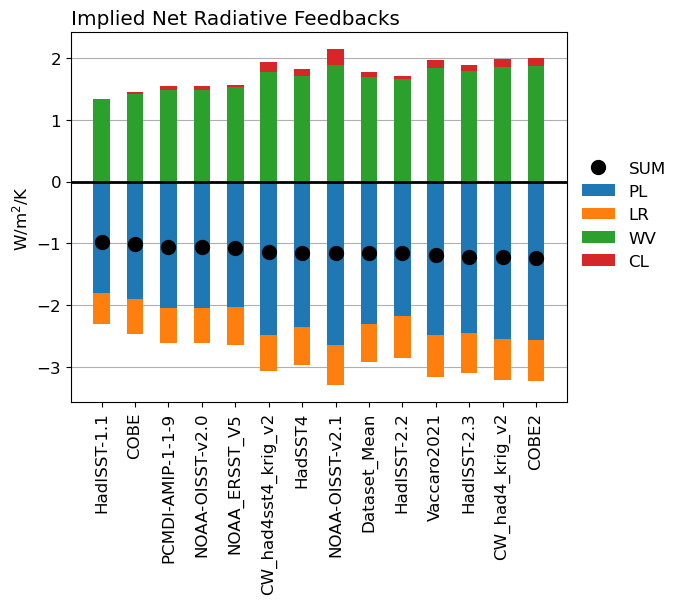

In [33]:
ax=plt.figure()
cnt=-1
Y={}
for X in a:
    cnt+=1
    dataname=datanames[X]
    SSTtrend = MAPS[dataname].regridder.horizontal('fbk', gfgrid, tool='xesmf', method='conservative')['fbk']   
    vector=[]
    variables = list(GF.keys())
    alpha=1
    posavg,negavg = 0,0
    # prod = SSTtrend*GF['TS']
    # denom = prod.sum().values
    Y[dataname]={}
    for v,var in enumerate(variables[1:-1]):
        prod = SSTtrend*GF[var]#/denom
        vector.append(prod.sum().values)
        Y[dataname][var] = vector[-1]
        COLOR='C'+str(v)  
        if X==0:
            LABEL = var
        else:
            LABEL = '_nolegend_'
        negavg,posavg = stacked_barplot(cnt,Y[dataname][var],0.5,negavg,posavg,COLOR,alpha,10,LABEL)     
    Y[dataname]['SUM'] = np.sum(np.array(vector))
    Y[dataname]['WV+LR'] = Y[dataname]['WV'] + Y[dataname]['LR']     
    if X==0:
        LABEL='SUM'
    else:
        LABEL = '_nolegend_'
    sep3,=plt.plot(cnt,Y[dataname]['SUM'],'o',mec='k',mfc='k',ms=10,zorder=20,label=LABEL)
plt.ylabel('W/m$^2$/K')
plt.axhline(y=0,ls='-',color='k',zorder=50)
plt.grid(axis='y')
ax.legend(ncol=1,frameon=False,fontsize=12,loc='center left', bbox_to_anchor=(0.9, 0.5))
# plt.ylim(-4,2.5)
_=plt.xticks(np.arange(len(a)),out,rotation=90)
_=plt.title('Implied Net Radiative Feedbacks',loc='left')


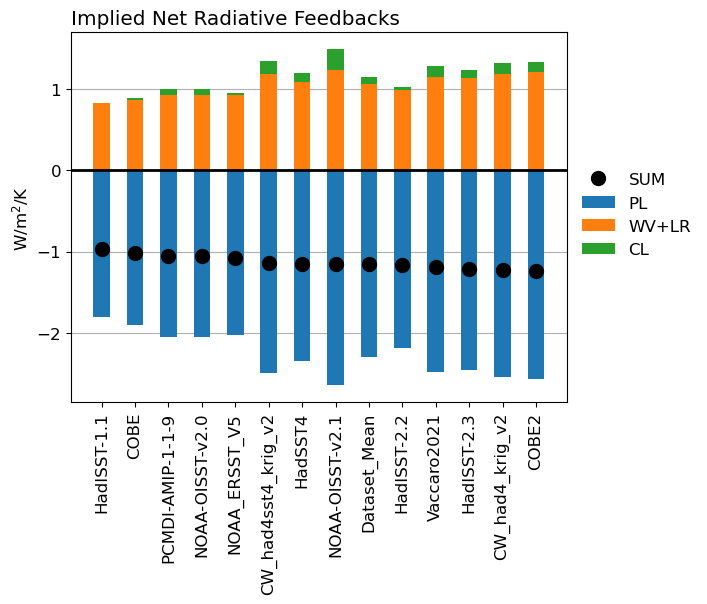

In [34]:
# same as previous but combine LR and WV:
ax=plt.figure()
cnt=-1
for X in a:
    cnt+=1
    dataname=datanames[X]
    alpha=1
    posavg,negavg = 0,0
    for v,var in enumerate(['PL','WV+LR','CL']):
        COLOR='C'+str(v)  
        if X==0:
            LABEL = var
        else:
            LABEL = '_nolegend_'
        negavg,posavg = stacked_barplot(cnt,Y[dataname][var],0.5,negavg,posavg,COLOR,alpha,10,LABEL)     
    if X==0:
        LABEL='SUM'
    else:
        LABEL = '_nolegend_'
    sep3,=plt.plot(cnt,Y[dataname]['SUM'],'o',mec='k',mfc='k',ms=10,zorder=20,label=LABEL)
plt.ylabel('W/m$^2$/K')
plt.axhline(y=0,ls='-',color='k',zorder=50)
plt.grid(axis='y')
ax.legend(ncol=1,frameon=False,fontsize=12,loc='center left', bbox_to_anchor=(0.9, 0.5))
_=plt.xticks(np.arange(len(a)),out,rotation=90)
_=plt.title('Implied Net Radiative Feedbacks',loc='left')


Text(0.0, 1.0, 'Implied Net Radiative Feedbacks [W/m$^2$/K]')

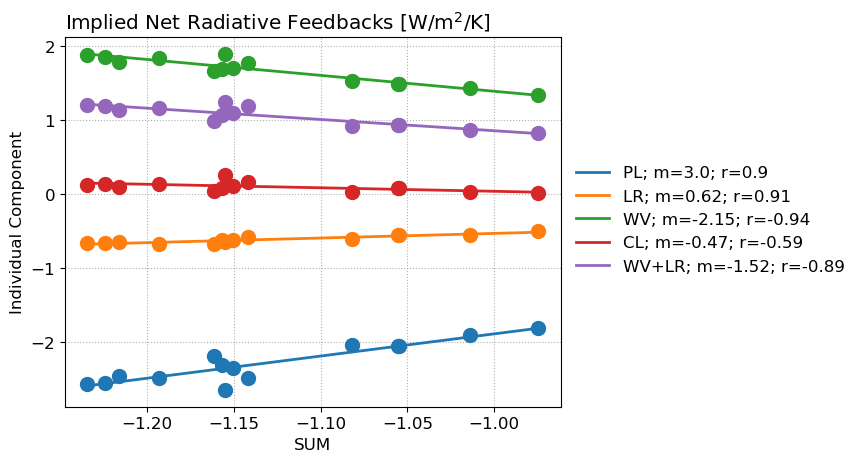

In [35]:
# Scatter the various feedbacks against the total net feedback:
ax=plt.figure()#figsize=(12,9))
for v,var in enumerate(['PL','LR','WV','CL','WV+LR']):#variables[1:-1]):
    x,y = [],[]
    for dataname in datanames:
        x.append(Y[dataname]['SUM'])
        y.append(Y[dataname][var])
    # plt.subplot(2,2,v+1)
    COL = 'C'+str(v)
    plt.plot(x,y,'o',color=COL,ms=10,zorder=10)
    slope, intercept, r, p, se = linregress(x,y)
    dummy = np.linspace(np.nanmin(x),np.nanmax(x),100)
    plt.plot(dummy,slope*dummy+intercept,lw=2,color=COL,label=var+'; m='+str(np.round(slope,2))+'; r='+str(np.round(r,2)))
ax.legend(ncol=1,frameon=False,fontsize=12,loc='center left', bbox_to_anchor=(0.9, 0.5))
plt.grid(ls=':')
plt.xlabel('SUM')
plt.ylabel('Individual Component')
plt.title('Implied Net Radiative Feedbacks [W/m$^2$/K]',loc='left')

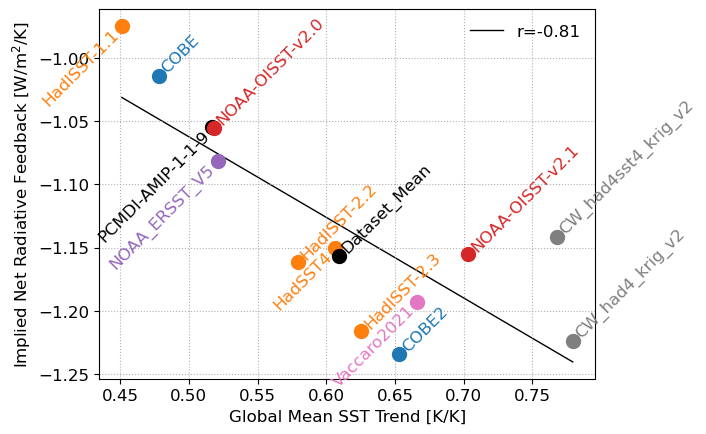

In [36]:
plt.subplots()
x,y = np.array(list(GLfbk.values())),np.array(bigvector)
slope, intercept, r, p, se = linregress(x,y)
dummy = np.linspace(np.nanmin(x),np.nanmax(x),100)
plt.plot(dummy,slope*dummy+intercept,lw=1,color='k',label='r='+str(np.round(r,2)),zorder=1)
plt.legend(frameon=False)

for d,dataname in enumerate(datanames):
    COL = 'C'+str(d)
    plt.plot(GLfbk[dataname],bigvector[d],'o',color=COLORS[dataname],ms=10,zorder=10)
    HA,VA = 'left','bottom'
    if d%3==0:
        HA,VA='right','top'
    plt.text(GLfbk[dataname],bigvector[d],dataname,ha=HA,va=VA,rotation=45,color=COLORS[dataname],zorder=10)
plt.xlabel('Global Mean SST Trend [K/K]')
plt.ylabel('Implied Net Radiative Feedback [W/m$^2$/K]')
plt.grid(ls=':')